#Problem Statement


---


- **About Walmart**


> Walmart is an American multinational retail corporation that operates a chain of supercenters, discount departmental stores, and grocery stores from the United States. Walmart has more than 100 million customers worldwide.

<br>

- **Business Problem**

> The Management team at Walmart Inc. wants to analyze the customer purchase behavior (specifically, purchase amount) against the customer’s gender and the various other factors to help the business make better decisions. They want to understand if the spending habits differ between male and female customers: Do women spend more on Black Friday than men? (Assume 50 million customers are male and 50 million are female).

[Google-Collab-Link](https://colab.research.google.com/drive/1X6tyDSGtsQA2HMGPcrf4b9jC9Iie4HqX?usp=sharing)

#Import Libraries

In [91]:
import math
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from scipy import stats

#Load Dataset


The company collected the transactional data of customers who purchased products from the Walmart Stores during Black Friday. The dataset has the following features:

Dataset link: [Walmart_data.csv](https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/293/original/walmart_data.csv?1641285094)

    User_ID:	User ID
    Product_ID:	Product ID
    Gender:	Sex of User
    Age:	Age in bins
    Occupation:	Occupation(Masked)
    City_Category:	Category of the City (A,B,C)
    StayInCurrentCityYears:	Number of years stay in current city
    Marital_Status:	Marital Status
    ProductCategory:	Product Category (Masked)
    Purchase:	Purchase Amount

In [92]:
df=pd.read_csv('https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/293/original/walmart_data.csv')
bak=df.copy(deep=True)
np.shares_memory(df,bak)

False

#Utility Functions

##Univariate plot Functions

In [138]:

def bar_plots(df, cat_cols, top_n=None, show_percent=True, color="royalblue"):
    """
    Vertical count bar plots for categorical columns with adaptive layout:
    - Columns with <10 unique categories: 2 per row
    - Columns with >=10 unique categories: 1 per row
    - Bars sorted descending
    - Counts + percentage displayed above bars
    - Solid deep color
    - Correct label alignment
    - Handles top_n categories and groups rest as 'Other'
    """

    # Split columns based on unique categories
    few_cat_cols = [col for col in cat_cols if df[col].nunique() < 10]
    many_cat_cols = [col for col in cat_cols if df[col].nunique() >= 10]

    # -------------------
    # Few categories (<10)
    # -------------------
    if few_cat_cols:
        n_cols = 2
        n_rows = int(np.ceil(len(few_cat_cols)/n_cols))
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 6*n_rows))
        axes = axes.flatten()

        for i, col in enumerate(few_cat_cols):
            counts = df[col].value_counts().sort_values(ascending=False)
            plot_data = counts.reset_index()
            plot_data.columns = [col, "count"]
            total = plot_data["count"].sum()

            ax = axes[i]
            sns.barplot(
                x=col,
                y="count",
                data=plot_data,
                ax=ax,
                color=color,
                order=plot_data[col].tolist()  # <-- ensures sorted order
            )

            ax.set_title(f"{col} Distribution", fontsize=14, fontweight="bold", pad=15)
            ax.set_ylabel("Count", fontsize=12)
            ax.set_xlabel(col, fontsize=12)

            # Rotate x labels if needed
            max_len = max(plot_data[col].astype(str).apply(len))
            if len(plot_data) > 5 or max_len > 10:
                plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

            y_max = plot_data["count"].max()
            ax.set_ylim(0, y_max * 1.2)

            # Annotate
            for p, count_val in zip(ax.patches, plot_data["count"]):
                label = f"{count_val}\n({count_val/total*100:.1f}%)" if show_percent else f"{count_val}"
                ax.annotate(
                    label,
                    (p.get_x() + p.get_width() / 2., p.get_height() + y_max*0.02),
                    ha="center", va="bottom",
                    fontsize=10, fontweight="bold", color="black"
                )

        # Remove empty axes
        for j in range(i+1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()

    # -------------------
    # Many categories (>=10)
    # -------------------
    for col in many_cat_cols:
        counts = df[col].value_counts()

        # Handle top_n
        if top_n is not None and top_n < len(counts):
            top_counts = counts.nlargest(top_n)
            other_count = counts.sum() - top_counts.sum()
            plot_data = top_counts.append(pd.Series({"Other": other_count}))
            plot_data = plot_data.sort_values(ascending=False)
        else:
            plot_data = counts.sort_values(ascending=False)

        plot_data = plot_data.reset_index()
        plot_data.columns = [col, "count"]
        total = plot_data["count"].sum()

        plt.figure(figsize=(16,6))
        ax = sns.barplot(
            x=col,
            y="count",
            data=plot_data,
            color=color,
            order=plot_data[col].tolist()  # <-- ensures sorted order
        )
        ax.set_title(f"{col} Distribution", fontsize=14, fontweight="bold", pad=15)
        ax.set_ylabel("Count", fontsize=12)
        ax.set_xlabel(col, fontsize=12)

        # Rotate x labels
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

        y_max = plot_data["count"].max()
        ax.set_ylim(0, y_max * 1.2)

        # Annotate
        for p, count_val in zip(ax.patches, plot_data["count"]):
            label = f"{count_val}\n({count_val/total*100:.1f}%)" if show_percent else f"{count_val}"
            ax.annotate(
                label,
                (p.get_x() + p.get_width() / 2., p.get_height() + y_max*0.02),
                ha="center", va="bottom",
                fontsize=10, fontweight="bold", color="black"
            )

        plt.tight_layout()
        plt.show()


In [150]:

def numerical_columns_distribution_with_stats(df):
    cols=df.select_dtypes(exclude='category').columns
    for col in cols:

      data = df[col].dropna()

      # Calculate statistics
      mean_val = data.mean()
      median_val = data.median()
      std_val = data.std()
      min_val = data.min()
      max_val = data.max()

      # Print statistics
      print(f"Statistics for {col}:")
      print(f"  Mean   : {mean_val:.2f}")
      print(f"  Median : {median_val:.2f}")
      print(f"  Std Dev: {std_val:.2f}")
      print(f"  Min    : {min_val:.2f}")
      print(f"  Max    : {max_val:.2f}")

      plt.figure(figsize=(15, 5))

      # Histogram
      plt.subplot(1, 3, 1)
      #plt.hist(data, bins=30, color='skyblue', edgecolor='black')
      sns.histplot(
        data=df,             # your DataFrame
        x=data,        # column to plot
        bins=30,             # number of bins
        kde=True,            # add kernel density estimate
        color='royalblue',   # bar color
        edgecolor='black',   # edge of bars
        stat='density'       # normalize histogram to density (optional)
        )
      plt.axvline(mean_val, color='red', linestyle='--', label=f"Mean: {mean_val:.0f}")
      plt.axvline(median_val, color='green', linestyle='--', label=f"Median: {median_val:.0f}")
      plt.title(f"Histogram of {col}")
      plt.xlabel(f"{col} Amount")
      plt.ylabel("Frequency")
      plt.legend()

      # Boxplot
      plt.subplot(1, 3, 2)
      sns.boxplot(x=data, color='orange')
      plt.title(f"Boxplot of {col}")
      plt.xlabel(f"{col} Amount")
      plt.text(mean_val, 0.02, f"Mean: {mean_val:.0f}", ha='center', color='red')
      plt.text(median_val, -0.05, f"Median: {median_val:.0f}", ha='center', color='green')

      # Density plot
      plt.subplot(1, 3, 3)
      sns.kdeplot(data, fill=True, color='green')
      plt.axvline(mean_val, color='red', linestyle='--', label=f"Mean: {mean_val:.0f}")
      plt.axvline(median_val, color='blue', linestyle='--', label=f"Median: {median_val:.0f}")
      plt.title(f"Density Plot of {col}")
      plt.xlabel(f"{col} Amount")
      plt.legend()

      plt.tight_layout()
      plt.show()


##Bivariate Plot Function

In [175]:

def bivariate_box_bar(df, cat_cols, target_col):
    """
    For each categorical column:
    - Left: Boxplot (numeric target vs categorical)
    - Right: Mean barplot (mean of target per category, numeric values on top)
    - Categories sorted by descending mean
    - Deep solid colors
    - 2 plots per row
    """
    sns.set_style("whitegrid")
    n_plots = len(cat_cols)

    fig, axes = plt.subplots(n_plots, 2, figsize=(14, 5*n_plots))

    # Ensure axes is 2D list
    if n_plots == 1:
        axes = [axes]

    for i, col in enumerate(cat_cols):
        ax_box, ax_bar = axes[i]

        # Sort categories by descending mean target
        cat_order = df.groupby(col, observed=True)[target_col] \
                      .mean().sort_values(ascending=False).index.tolist()

        # Boxplot
        sns.boxplot(x=col, y=target_col, data=df, ax=ax_box, color='royalblue', order=cat_order)
        ax_box.set_title(f"Boxplot: {target_col} vs {col}", fontsize=13, fontweight='bold')
        ax_box.set_xlabel(col)
        ax_box.set_ylabel(target_col)
        ax_box.tick_params(axis='x', rotation=45)

        # Mean Barplot
        mean_df = df.groupby(col, observed=True)[target_col] \
                    .mean().reindex(cat_order).reset_index()
        sns.barplot(x=col, y=target_col, data=mean_df, ax=ax_bar, color='darkorange')
        ax_bar.set_title(f"Mean {target_col} per {col}", fontsize=13, fontweight='bold')
        ax_bar.set_xlabel(col)
        ax_bar.set_ylabel(f"Mean {target_col}")
        ax_bar.tick_params(axis='x', rotation=45)

        # Add numeric values on top of bars
        for idx, row in mean_df.iterrows():
            ax_bar.text(idx, row[target_col] + row[target_col]*0.01, f"{row[target_col]:.2f}",
                        ha='center', va='bottom', fontsize=10, fontweight='bold')

    # Remove unused axes if any (for odd number of cat_cols)
    if n_plots % 2 != 0 and n_plots > 1:
        fig.delaxes(axes[-1][1])

    plt.tight_layout()
    plt.show()


In [187]:

def bivariate_cat_plots(df, cat_cols):
    """
    Generates bivariate plots between all pairs of categorical columns.
    - Grouped bar plot (if target_col is numeric, shows mean, else count)
    - Heatmap for counts or mean target
    - 2 plots per row
    """
    from itertools import combinations
    sns.set_style("whitegrid")

    cat_pairs = list(combinations(cat_cols, 2))
    n_pairs = len(cat_pairs)

    fig_rows = (n_pairs + 1) // 2
    fig, axes = plt.subplots(fig_rows, 2, figsize=(14, 5*fig_rows))

    if n_pairs == 1:
        axes = [axes]
    axes = axes.flatten()

    for i, (col1, col2) in enumerate(cat_pairs):
        ax1 = axes[i]


        ct = pd.crosstab(df[col1], df[col2], normalize='index')*100
        sns.heatmap(ct, annot=True, fmt=".1f", cmap='Blues', ax=ax1)
        ax1.set_title(f"Percentage Heatmap: {col1} vs {col2}")
        ax1.set_ylabel(col1)
        ax1.set_xlabel(col2)

    # Remove unused axes
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


##Outlier Detection Functions

In [179]:

def iqr_outliers_boxplot(df):
    """
    Detects outliers in numeric columns using the IQR method

    """
    sns.set_palette("deep")  # Deep solid color theme
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        outliers = df[(df[col] < lower) | (df[col] > upper)][col]

        print(f"\nColumn: {col}")
        print(f"Number of outliers (IQR method): {len(outliers)}")

        # Boxplot
        plt.figure(figsize=(6,4))
        sns.boxplot(x=df[col], color='royalblue')
        plt.title(f'Boxplot of {col}')
        plt.show()


##Confidence Intervals Functions

In [98]:


def plot_purchase_distribution_by_category(df, target_col='Purchased', cat_col='Gender',confidence=0.95, bootstrap_samples=5000):
    """
    Plot purchase distributions across categories of any categorical column.
    - Each category gets a distinct histogram color.
    - Shows population & bootstrap mean/CI on the plot.
    - Prints numeric statistics for each category.

    Parameters:
    - df: pandas DataFrame
    - target_col: numeric column to analyze (e.g., 'Purchased')
    - cat_col: categorical column to group by (e.g., 'Gender', 'Marital_Status', 'Age_Category')
    - confidence: confidence level for CI
    - bootstrap_samples: number of bootstrap resamples
    """
    categories = sorted(df[cat_col].dropna().unique())
    n_groups = len(categories)
    n_cols = 2
    n_rows = int(np.ceil(n_groups / n_cols))

    # Distinct colors per category
    palette = sns.color_palette("deep", n_groups)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows*4))
    axes = axes.flatten()

    for i, (cat, color) in enumerate(zip(categories, palette)):
        df_group = df[df[cat_col] == cat]
        values = df_group[target_col].dropna()
        n = len(values)

        # Population stats
        pop_mean = values.mean()
        pop_std = values.std(ddof=1)
        z = stats.norm.ppf(0.5 + confidence/2)
        pop_ci_lower = pop_mean - z*(pop_std/np.sqrt(n))
        pop_ci_upper = pop_mean + z*(pop_std/np.sqrt(n))

        # Bootstrap stats
        boot_means = [np.mean(np.random.choice(values, size=n, replace=True)) for _ in range(bootstrap_samples)]
        boot_mean = np.mean(boot_means)
        boot_ci_lower = np.percentile(boot_means, (1-confidence)/2*100)
        boot_ci_upper = np.percentile(boot_means, (1+confidence)/2*100)

        # Print stats
        print(f"{cat_col}={cat}: n={n}, "
              f"pop_mean={pop_mean:.2f}, {int(confidence*100)}% CI=[{pop_ci_lower:.2f}, {pop_ci_upper:.2f}], "
              f"boot_mean={boot_mean:.2f}, boot_CI=[{boot_ci_lower:.2f}, {boot_ci_upper:.2f}]")

        # Plot histogram
        counts, bins, patches = axes[i].hist(boot_means, bins=50, color=color, edgecolor='black', alpha=0.7, label='Bootstrap distribution')

        # Population mean & CI
        axes[i].axvline(pop_mean, color='red', linestyle='--', label=f'Pop mean: {pop_mean:.2f}')
        axes[i].axvline(pop_ci_lower, color='green', linestyle='--', label=f'Pop CI lower: {pop_ci_lower:.2f}')
        axes[i].axvline(pop_ci_upper, color='green', linestyle='--', label=f'Pop CI upper: {pop_ci_upper:.2f}')

        # Bootstrap mean & CI
        axes[i].axvline(boot_mean, color='purple', linestyle='-', label=f'Boot mean: {boot_mean:.2f}')
        axes[i].axvline(boot_ci_lower, color='orange', linestyle=':', label=f'Boot CI lower: {boot_ci_lower:.2f}')
        axes[i].axvline(boot_ci_upper, color='orange', linestyle=':', label=f'Boot CI upper: {boot_ci_upper:.2f}')

        # Annotate numeric stats on plot
        axes[i].text(0.95, 0.95, f"Pop mean: {pop_mean:.0f}\nPop CI: [{pop_ci_lower:.0f},{pop_ci_upper:.0f}]\n"
                                   f"Boot mean: {boot_mean:.0f}\nBoot CI: [{boot_ci_lower:.0f},{boot_ci_upper:.0f}]",
                     transform=axes[i].transAxes, fontsize=9, verticalalignment='top', horizontalalignment='right',
                     bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray'))

        axes[i].set_title(f"{cat_col}: {cat}")
        axes[i].set_xlabel(f"{target_col}")
        axes[i].set_ylabel("Frequency")
        axes[i].legend(fontsize=8)

    # Remove empty subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


#Basic Analysis

##Non-Graphical Analysis

In [102]:
df.shape

(550068, 10)

In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   User_ID                     550068 non-null  int64 
 1   Product_ID                  550068 non-null  object
 2   Gender                      550068 non-null  object
 3   Age                         550068 non-null  object
 4   Occupation                  550068 non-null  int64 
 5   City_Category               550068 non-null  object
 6   Stay_In_Current_City_Years  550068 non-null  object
 7   Marital_Status              550068 non-null  int64 
 8   Product_Category            550068 non-null  int64 
 9   Purchase                    550068 non-null  int64 
dtypes: int64(5), object(5)
memory usage: 42.0+ MB


In [104]:
df.head(2)

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,15200


In [105]:
for i in df.columns:
  print('-'*20)
  print(i)
  print('-'*20)
  print(df[i].value_counts())
  print('='*20,'\n\n')

--------------------
User_ID
--------------------
User_ID
1001680    1026
1004277     979
1001941     898
1001181     862
1000889     823
           ... 
1004991       7
1005391       7
1000094       7
1005608       7
1000708       6
Name: count, Length: 5891, dtype: int64


--------------------
Product_ID
--------------------
Product_ID
P00265242    1880
P00025442    1615
P00110742    1612
P00112142    1562
P00057642    1470
             ... 
P00325342       1
P00312542       1
P00008942       1
P00315142       1
P00365942       1
Name: count, Length: 3631, dtype: int64


--------------------
Gender
--------------------
Gender
M    414259
F    135809
Name: count, dtype: int64


--------------------
Age
--------------------
Age
26-35    219587
36-45    110013
18-25     99660
46-50     45701
51-55     38501
55+       21504
0-17      15102
Name: count, dtype: int64


--------------------
Occupation
--------------------
Occupation
4     72308
0     69638
7     59133
1     47426
17    4004

In [106]:
for i in df.columns:
  print('-'*20)
  print(i)
  print('-'*20)
  print(df[i].value_counts(normalize=True)*100)
  print('='*20,'\n\n')

--------------------
User_ID
--------------------
User_ID
1001680    0.186522
1004277    0.177978
1001941    0.163253
1001181    0.156708
1000889    0.149618
             ...   
1004991    0.001273
1005391    0.001273
1000094    0.001273
1005608    0.001273
1000708    0.001091
Name: proportion, Length: 5891, dtype: float64


--------------------
Product_ID
--------------------
Product_ID
P00265242    0.341776
P00025442    0.293600
P00110742    0.293055
P00112142    0.283965
P00057642    0.267240
               ...   
P00325342    0.000182
P00312542    0.000182
P00008942    0.000182
P00315142    0.000182
P00365942    0.000182
Name: proportion, Length: 3631, dtype: float64


--------------------
Gender
--------------------
Gender
M    75.310507
F    24.689493
Name: proportion, dtype: float64


--------------------
Age
--------------------
Age
26-35    39.919974
36-45    19.999891
18-25    18.117760
46-50     8.308246
51-55     6.999316
55+       3.909335
0-17      2.745479
Name: proporti

---
      'User_ID', 'Product_ID','Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category'

These columns should be of dtype='category'


---



      'Purchase'
dtype = 'int'




In [107]:
def age_cat(df):

    if df == '0-17':
        return 'Teenager'
    elif df == '18-25':
        return 'Early 20s'
    elif df == '26-35':
        return 'Early 30s'
    elif df == '36-45':
        return 'Middle Age'
    elif df == '46-50':
        return 'Middle Age'
    elif df == '51-55':
        return 'Senior'
    else:
        return 'Senior'

df['Age_Category'] = df['Age'].apply(age_cat)
df.columns

Index(['User_ID', 'Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category',
       'Purchase', 'Age_Category'],
      dtype='object')

In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   User_ID                     550068 non-null  int64 
 1   Product_ID                  550068 non-null  object
 2   Gender                      550068 non-null  object
 3   Age                         550068 non-null  object
 4   Occupation                  550068 non-null  int64 
 5   City_Category               550068 non-null  object
 6   Stay_In_Current_City_Years  550068 non-null  object
 7   Marital_Status              550068 non-null  int64 
 8   Product_Category            550068 non-null  int64 
 9   Purchase                    550068 non-null  int64 
 10  Age_Category                550068 non-null  object
dtypes: int64(5), object(6)
memory usage: 46.2+ MB


In [109]:
df['Age_Category'].value_counts(normalize=True)*100

,proportion
Age_Category,
Early 30s,39.919974
Middle Age,28.308136
Early 20s,18.117760
Senior,10.908651
Teenager,2.745479


In [110]:
for i in df.columns:
  if i!='Purchase':
    df[i]=df[i].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   User_ID                     550068 non-null  category
 1   Product_ID                  550068 non-null  category
 2   Gender                      550068 non-null  category
 3   Age                         550068 non-null  category
 4   Occupation                  550068 non-null  category
 5   City_Category               550068 non-null  category
 6   Stay_In_Current_City_Years  550068 non-null  category
 7   Marital_Status              550068 non-null  category
 8   Product_Category            550068 non-null  category
 9   Purchase                    550068 non-null  int64   
 10  Age_Category                550068 non-null  category
dtypes: category(10), int64(1)
memory usage: 10.8 MB


In [111]:
df.describe()

,Purchase
count,550068.000000
mean,9263.968713
std,5023.065394
min,12.000000
25%,5823.000000
50%,8047.000000
75%,12054.000000
max,23961.000000


In [116]:
category_cols=df.select_dtypes(include='category').columns[2:]
category_cols

Index(['Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category',
       'Age_Category'],
      dtype='object')

In [117]:
df.nunique()

,0
User_ID,5891
Product_ID,3631
Gender,2
Age,7
Occupation,21
City_Category,3
Stay_In_Current_City_Years,5
Marital_Status,2
Product_Category,20
Purchase,18105


In [118]:
for i in category_cols:
  print(i)
  print(df[i].unique())
  print('-'*20)

Gender
['F', 'M']
Categories (2, object): ['F', 'M']
--------------------
Age
['0-17', '55+', '26-35', '46-50', '51-55', '36-45', '18-25']
Categories (7, object): ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+']
--------------------
Occupation
[10, 16, 15, 7, 20, ..., 18, 5, 14, 13, 6]
Length: 21
Categories (21, int64): [0, 1, 2, 3, ..., 17, 18, 19, 20]
--------------------
City_Category
['A', 'C', 'B']
Categories (3, object): ['A', 'B', 'C']
--------------------
Stay_In_Current_City_Years
['2', '4+', '3', '1', '0']
Categories (5, object): ['0', '1', '2', '3', '4+']
--------------------
Marital_Status
[0, 1]
Categories (2, int64): [0, 1]
--------------------
Product_Category
[3, 1, 12, 8, 5, ..., 10, 17, 9, 20, 19]
Length: 20
Categories (20, int64): [1, 2, 3, 4, ..., 17, 18, 19, 20]
--------------------
Age_Category
['Teenager', 'Senior', 'Early 30s', 'Middle Age', 'Early 20s']
Categories (5, object): ['Early 20s', 'Early 30s', 'Middle Age', 'Senior', 'Teenager']
----------

In [119]:
# Aggregate user-level stats
df_user = df.groupby("User_ID",observed=False).agg(
    mean_purchase=("Purchase", "mean"),
    total_purchase=("Purchase", "sum"),
    gender=("Gender", "first"),
    marital_status=("Marital_Status", "first"),
    age=("Age", "first"),
    age_category=("Age_Category", "first"),
    city=("City_Category", "first"),
    occupation=("Occupation", "first")
).reset_index()

print(df_user.shape)
df_user.head()


(5891, 9)


,User_ID,mean_purchase,total_purchase,gender,marital_status,age,age_category,city,occupation
0,1000001,9545.514286,334093,F,0,0-17,Teenager,A,10
1,1000002,10525.610390,810472,M,0,55+,Senior,C,16
2,1000003,11780.517241,341635,M,0,26-35,Early 30s,A,15
3,1000004,14747.714286,206468,M,1,46-50,Middle Age,B,7
4,1000005,7745.292453,821001,M,1,26-35,Early 30s,A,20


In [120]:
df_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5891 entries, 0 to 5890
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   User_ID         5891 non-null   category
 1   mean_purchase   5891 non-null   float64 
 2   total_purchase  5891 non-null   int64   
 3   gender          5891 non-null   category
 4   marital_status  5891 non-null   category
 5   age             5891 non-null   category
 6   age_category    5891 non-null   category
 7   city            5891 non-null   category
 8   occupation      5891 non-null   category
dtypes: category(7), float64(1), int64(1)
memory usage: 314.9 KB


In [121]:
df_user.describe()

,mean_purchase,total_purchase
count,5891.000000,5.891000e+03
mean,9568.839914,8.650166e+05
std,1890.087105,9.436445e+05
min,2318.733333,4.668100e+04
25%,8287.212366,2.376780e+05
50%,9386.208333,5.212130e+05
75%,10654.633199,1.119250e+06
max,18577.893617,1.053691e+07


In [122]:
user_cat=df_user.select_dtypes(include='category').columns[1:]
user_cat

Index(['gender', 'marital_status', 'age', 'age_category', 'city',
       'occupation'],
      dtype='object')

In [123]:
for i in user_cat:
  print(i)
  print(df_user[i].unique())
  print('-'*20)

gender
['F', 'M']
Categories (2, object): ['F', 'M']
--------------------
marital_status
[0, 1]
Categories (2, int64): [0, 1]
--------------------
age
['0-17', '55+', '26-35', '46-50', '51-55', '36-45', '18-25']
Categories (7, object): ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+']
--------------------
age_category
['Teenager', 'Senior', 'Early 30s', 'Middle Age', 'Early 20s']
Categories (5, object): ['Early 20s', 'Early 30s', 'Middle Age', 'Senior', 'Teenager']
--------------------
city
['A', 'C', 'B']
Categories (3, object): ['A', 'B', 'C']
--------------------
occupation
[10, 16, 15, 7, 20, ..., 2, 18, 5, 13, 6]
Length: 21
Categories (21, int64): [0, 1, 2, 3, ..., 17, 18, 19, 20]
--------------------


In [124]:
for i in user_cat:
  print('-'*20)
  print(i)
  print('-'*20)
  print(df_user[i].value_counts(normalize=True)*100)
  print('='*20,'\n\n')

--------------------
gender
--------------------
gender
M    71.719572
F    28.280428
Name: proportion, dtype: float64


--------------------
marital_status
--------------------
marital_status
0    58.003735
1    41.996265
Name: proportion, dtype: float64


--------------------
age
--------------------
age
26-35    34.849771
36-45    19.809879
18-25    18.146325
46-50     9.013750
51-55     8.164997
55+       6.314717
0-17      3.700560
Name: proportion, dtype: float64


--------------------
age_category
--------------------
age_category
Early 30s     34.849771
Middle Age    28.823629
Early 20s     18.146325
Senior        14.479715
Teenager       3.700560
Name: proportion, dtype: float64


--------------------
city
--------------------
city
C    53.284672
B    28.976405
A    17.738924
Name: proportion, dtype: float64


--------------------
occupation
--------------------
occupation
4     12.561535
0     11.678832
7     11.356306
1      8.776099
17     8.334748
12     6.382618
14     4.

In [125]:
user_num=df_user.select_dtypes(exclude='category').columns
user_num

Index(['mean_purchase', 'total_purchase'], dtype='object')

In [126]:
df_user[user_num].describe()

,mean_purchase,total_purchase
count,5891.000000,5.891000e+03
mean,9568.839914,8.650166e+05
std,1890.087105,9.436445e+05
min,2318.733333,4.668100e+04
25%,8287.212366,2.376780e+05
50%,9386.208333,5.212130e+05
75%,10654.633199,1.119250e+06
max,18577.893617,1.053691e+07


In [127]:
len(category_cols),len(user_cat),len(user_num)

(8, 6, 2)

##Visual Analysis - Univariate & Bivariate

###Univariate Analysis

#### For df

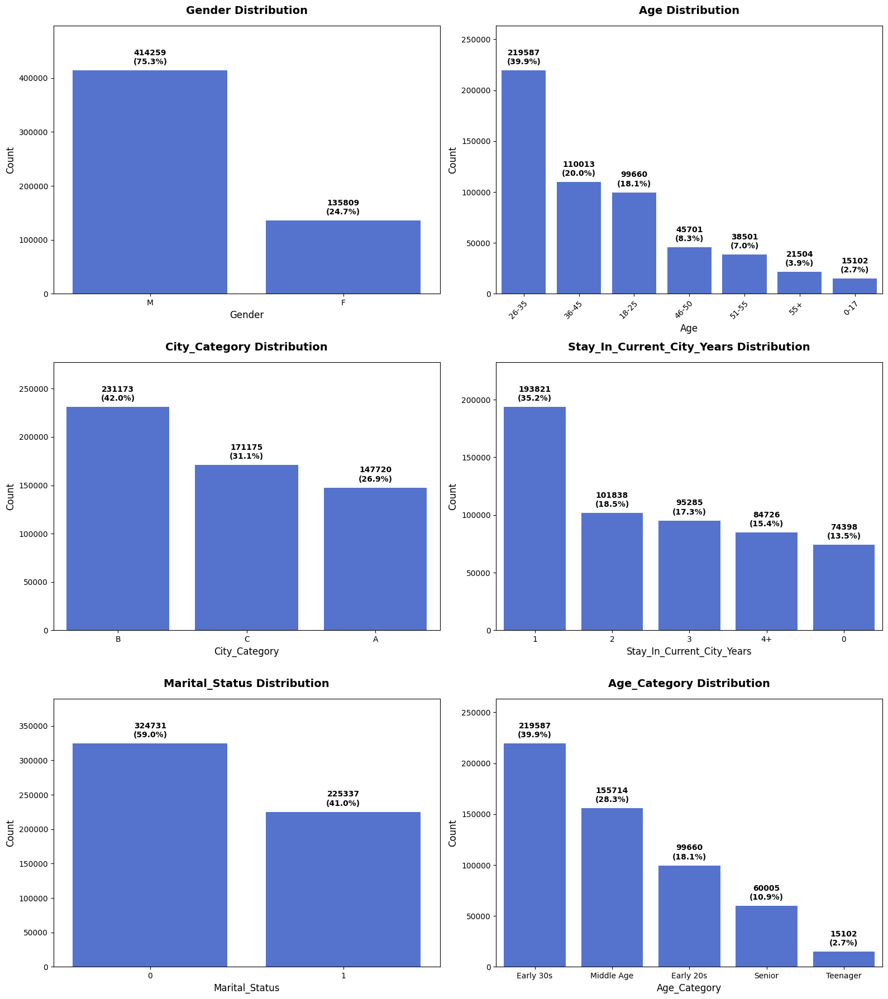

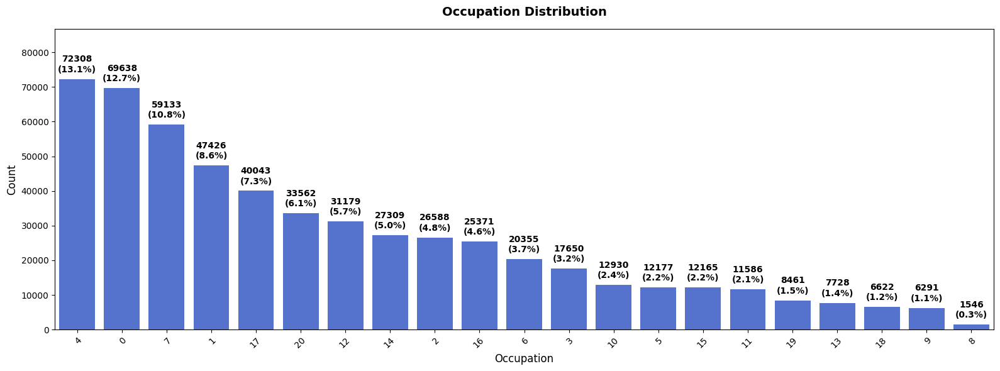

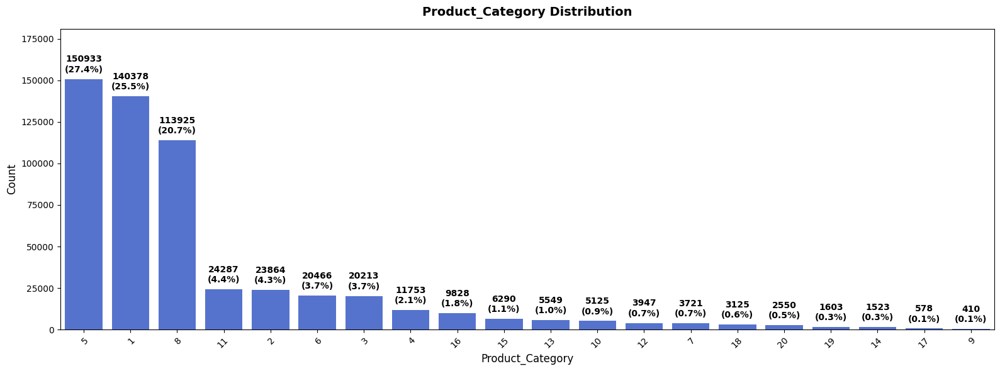

In [137]:
bar_plots(df,category_cols,show_percent=True)

| Attribute                | Key Insight                                                            | Actionable Recommendation                                                                                                        |
| ------------------------ | ---------------------------------------------------------------------- | -------------------------------------------------------------------------------------------------------------------------------- |
| **Gender**               | 72% of buyers are male, 28% female                                     | Promote male-targeted products but create campaigns to attract more female buyers for higher sales.                              |
| **Age**                  | Largest buyers: 26–35 (40%), 36–45 (20%), 18–25 (18%)                  | Target Black Friday promotions to the 26–35 age group; offer deals that appeal to both younger (18–25) and older (36+) segments. |
| **Marital Status**       | 59% single, 41% married                                                | Design Black Friday bundles for families (married) and special single-buyer deals.                                               |
| **City Category**        | Most purchases from B (42%) and C (31%) cities; A city contributes 27% | Focus marketing campaigns and logistics planning for B & C cities while maintaining premium offerings in city A.                 |
| **Stay in Current City** | 35% of customers have lived ≤1 year in the city                        | Offer loyalty incentives to new residents during Black Friday to encourage repeat shopping.                                      |
| **Occupation**           | Top-spending occupations: 4 (13%), 0 (12%), 7 (11%)                    | Target high-spending occupations with premium offers and early-bird deals.                                                       |


| Attribute                        | Key Insight                                                           | Actionable Recommendation                                                                  |
| -------------------------------- | --------------------------------------------------------------------- | ------------------------------------------------------------------------------------------ |
| **Top Product Categories**       | Category 5 (27%), 1 (26%), 8 (21%)                                    | Ensure sufficient stock for these categories and promote them heavily during Black Friday. |
| **Low-Selling Categories**       | Categories 17, 9, 20 <1% of purchases                                 | Consider flash deals or marketing to boost visibility or phase out slow-moving items.      |
| **Purchase Amount Distribution** | Majority of buyers are mid-range spenders; few very high-value buyers | Bundle mid-range products for volume sales; offer premium deals to top buyers.             |


>Male customers dominate spending even more than their proportion of the customer base (~72%).

>The 26–35 age group drives the largest portion of revenue, even more than their representation (34.85% of users).

>City B drives the highest revenue, even though in counts City C had the highest proportion in df_user. Indicates City B customers spend more per capita.

Statistics for Purchase:
  Mean   : 9263.97
  Median : 8047.00
  Std Dev: 5023.07
  Min    : 12.00
  Max    : 23961.00


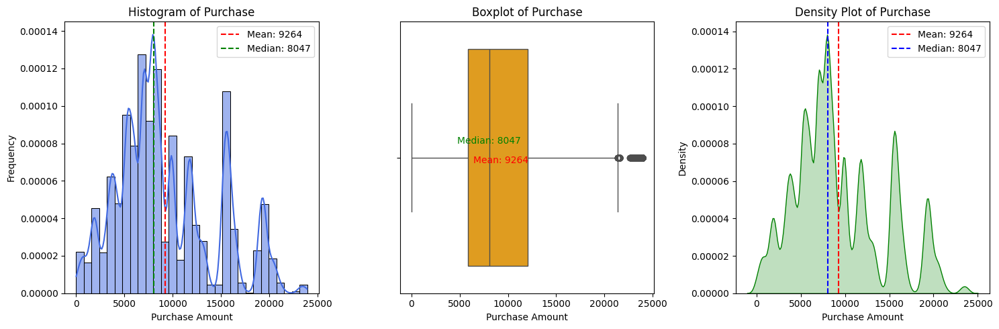

In [151]:
numerical_columns_distribution_with_stats(df)

####For df_user

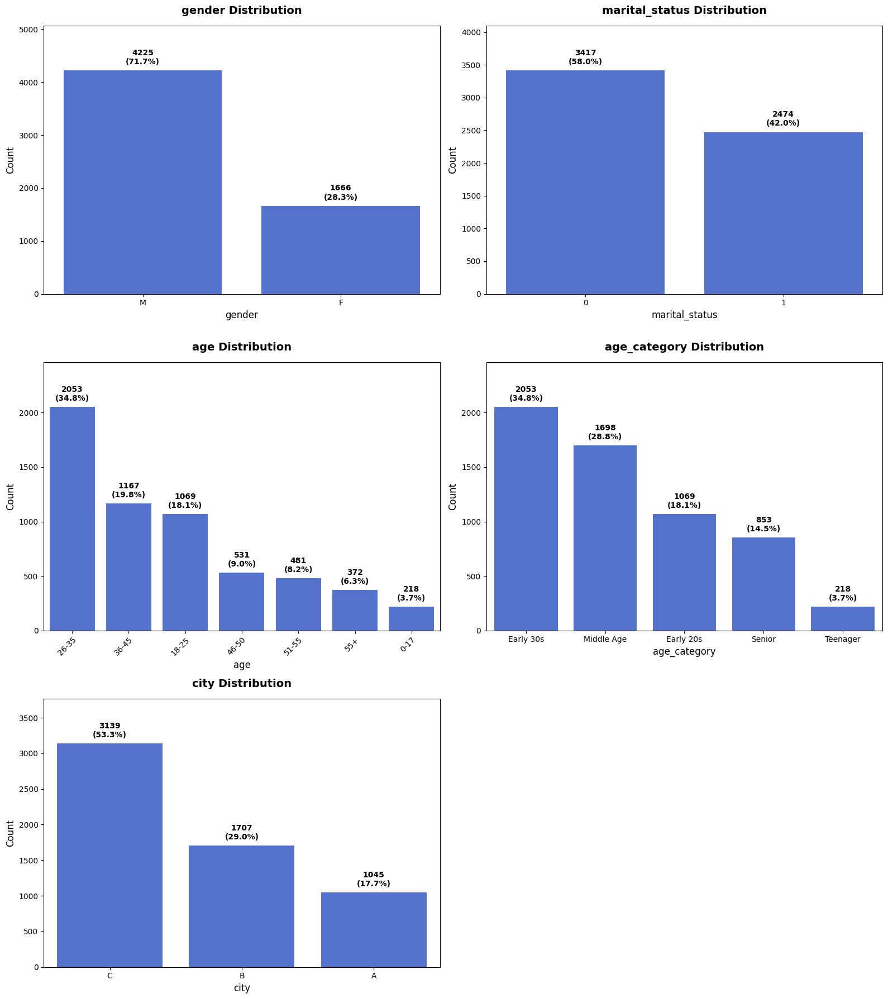

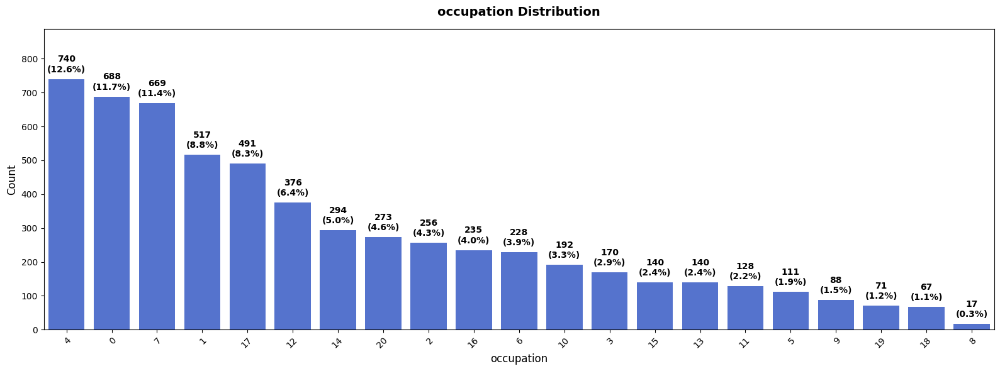

In [141]:
bar_plots(df_user,user_cat,show_percent=True)

>The dataset is heavily male-dominated (~3:1 ratio). Any marketing or analysis should consider that males form the bulk of buyers.

>lightly more unmarried customers. Promotions targeting married households may need stronger incentives to balance engagement.

>26–35 is the largest segment, followed by 36–45 and 18–25. Teens and older adults form small portions.

>Consistent with raw age distribution; largest spending and representation is 30s → Middle Age, small portion of Teenagers.

>City C dominates the dataset (>50%), so regional strategies could prioritize this city.


Demographics skewed male (72%) and City C (~53%).

Largest age segments: 26–35 and 36–45 → high-value audience.

Top occupations (4, 0, 7, 1, 17) represent ~52% of the dataset → focus on them for core campaigns.

Small segments (e.g., Teens, seniors, rare occupations) could be targeted with special offers or personalization, but they don’t drive most sales.

Statistics for mean_purchase:
  Mean   : 9568.84
  Median : 9386.21
  Std Dev: 1890.09
  Min    : 2318.73
  Max    : 18577.89


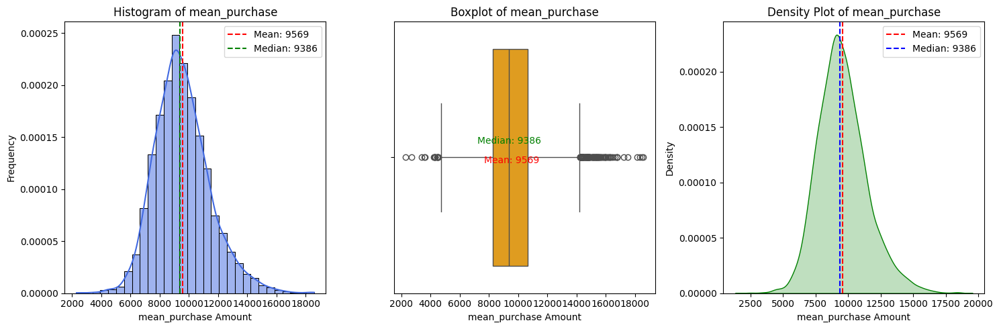

Statistics for total_purchase:
  Mean   : 865016.59
  Median : 521213.00
  Std Dev: 943644.54
  Min    : 46681.00
  Max    : 10536909.00


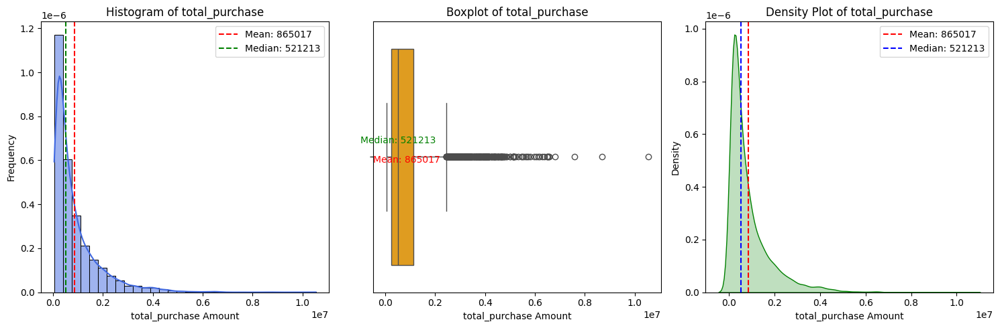

In [152]:
numerical_columns_distribution_with_stats(df_user)

### Bivariate Analysis

####For df

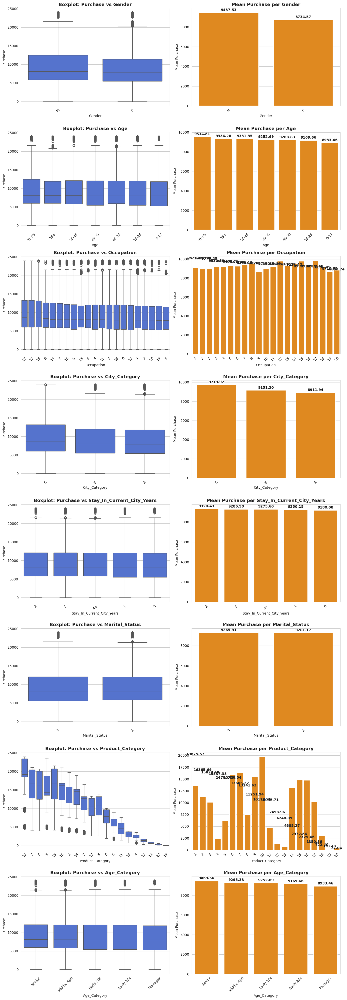

In [189]:
bivariate_box_bar(df,category_cols,'Purchase')

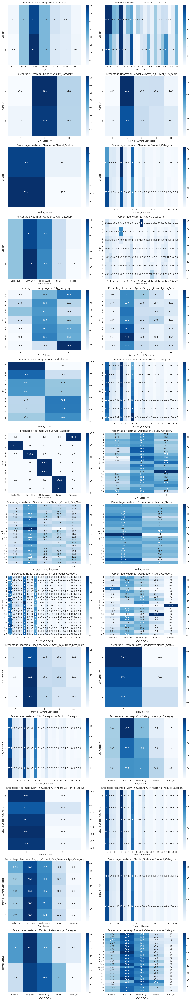

In [190]:
bivariate_cat_plots(df, category_cols)

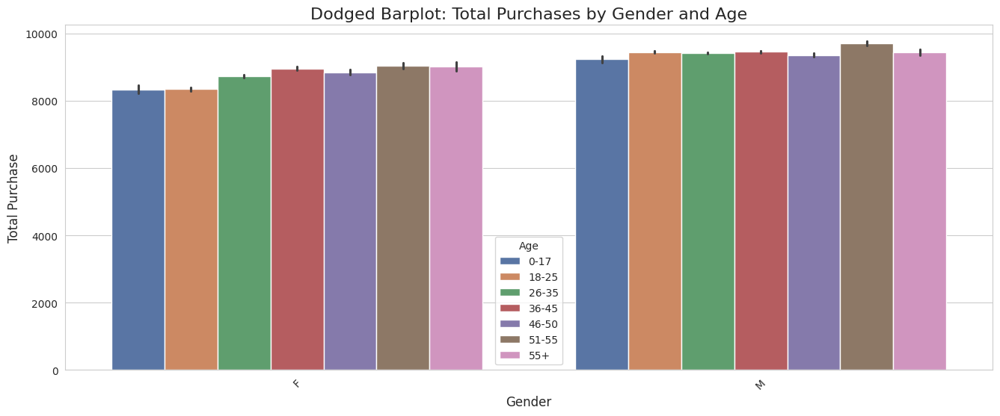

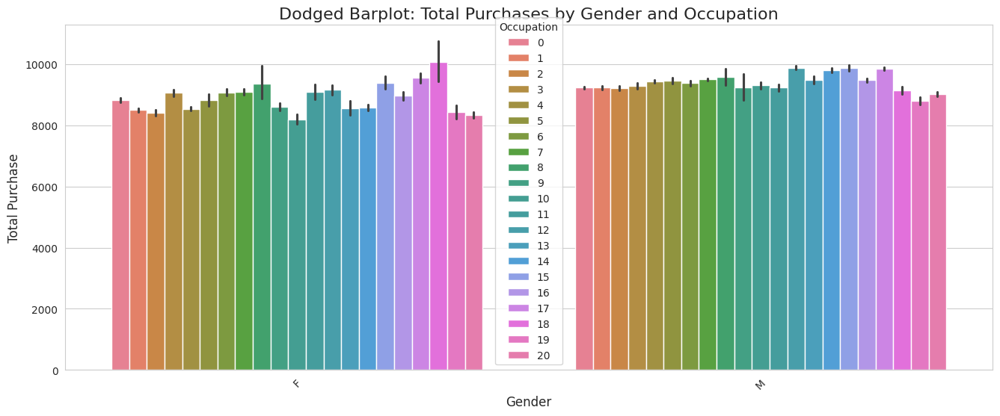

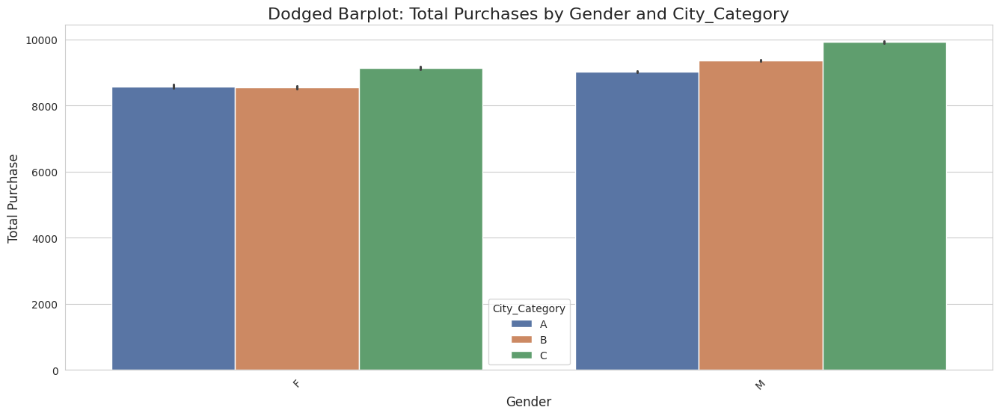

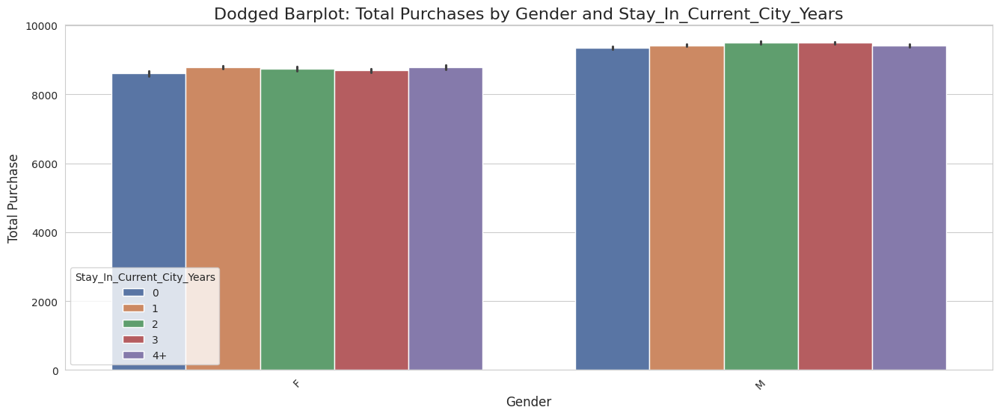

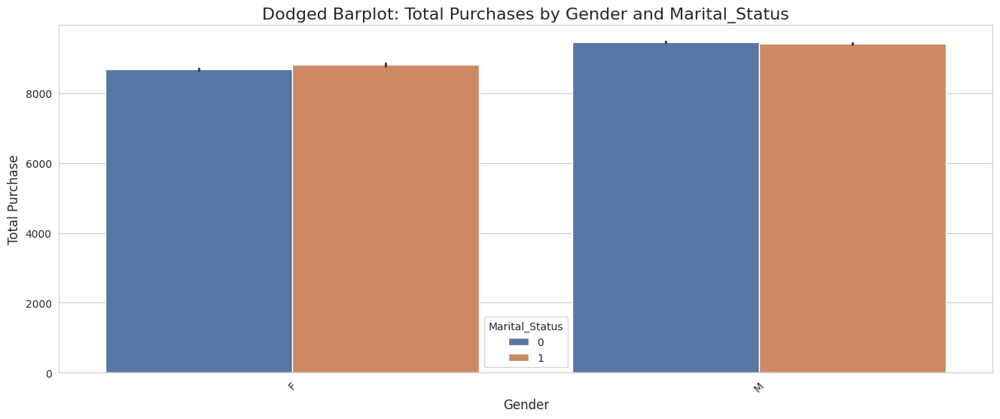

...

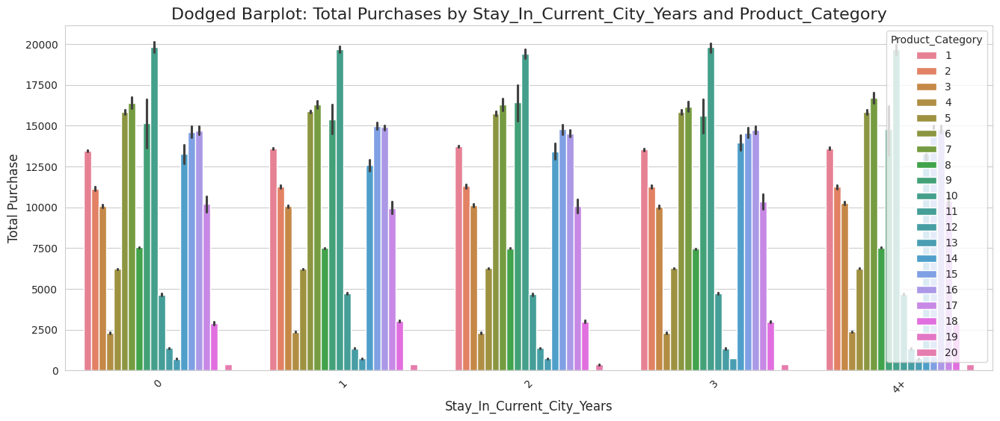

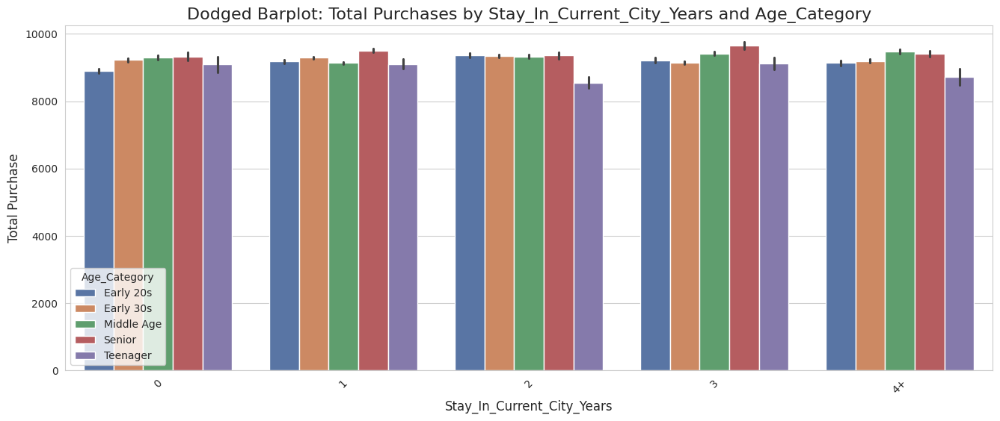

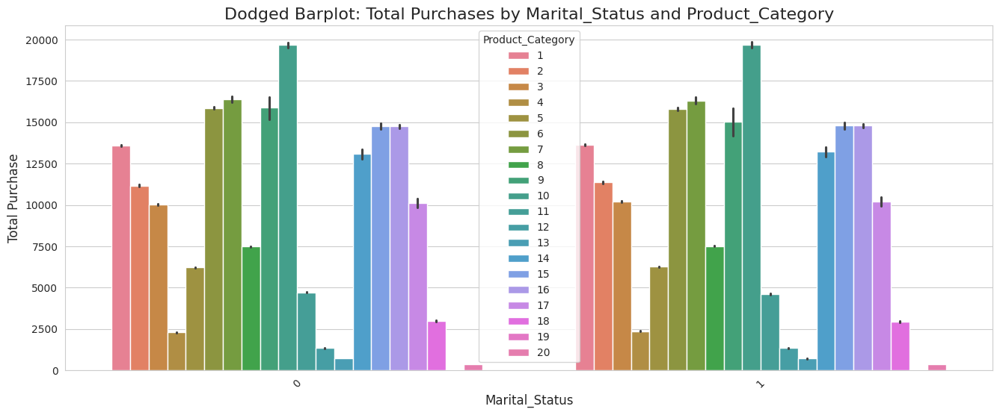

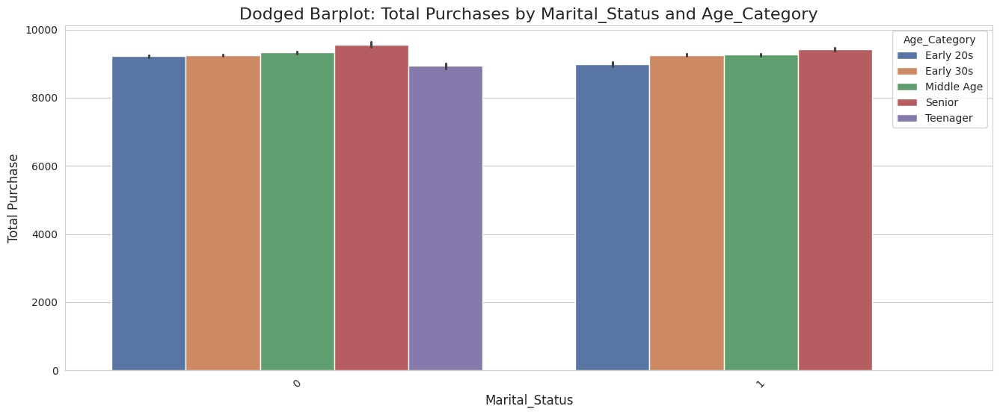

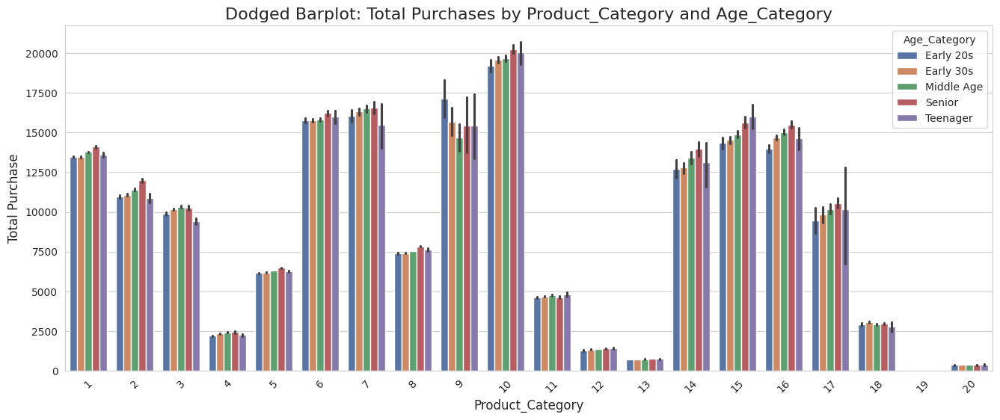

In [207]:
xxx=list(itertools.combinations(category_cols, 2))
for i in xxx:
  plt.figure(figsize=(16,6))
  sns.barplot(
      data=df,
      x=i[0],
      y='Purchase',
      hue=i[1]
  )
  s="Dodged Barplot: Total Purchases by "+str(i[0])+" and "+str(i[1])
  plt.title(s, fontsize=16)
  plt.xlabel(i[0], fontsize=12)
  plt.ylabel("Total Purchase", fontsize=12)
  plt.xticks(rotation=45)
  plt.legend(title=i[1])
  plt.show()

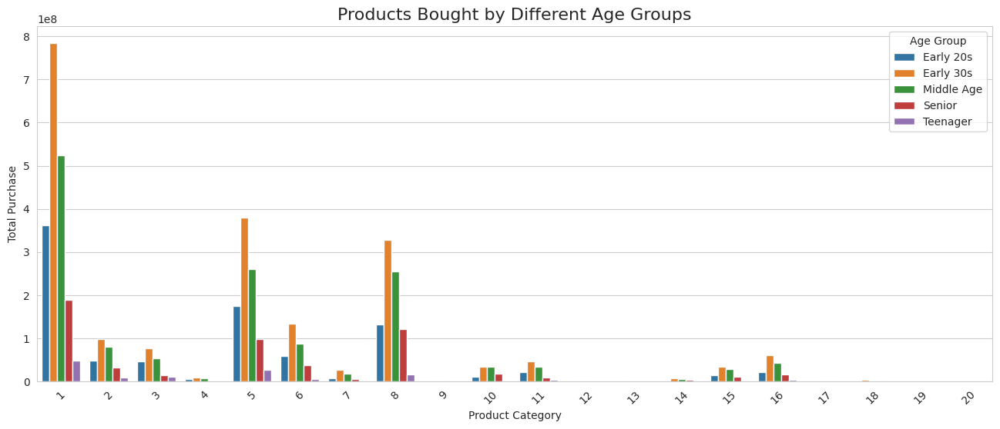

In [214]:

# Aggregate total purchase per Product_Category and Age_Category
agg_df = df.groupby(['Product_Category', 'Age_Category'], observed=True)['Purchase'].sum().reset_index()

# Plot dodged barplot
plt.figure(figsize=(16,6))
sns.barplot(
    data=agg_df,
    x='Product_Category',
    y='Purchase',
    hue='Age_Category',
    dodge=True,
    palette='tab10'
)
plt.title("Products Bought by Different Age Groups", fontsize=16)
plt.xlabel("Product Category")
plt.ylabel("Total Purchase")
plt.xticks(rotation=45)
plt.legend(title='Age Group')
plt.show()


>Product category 1,5,8 are most customers are buying.


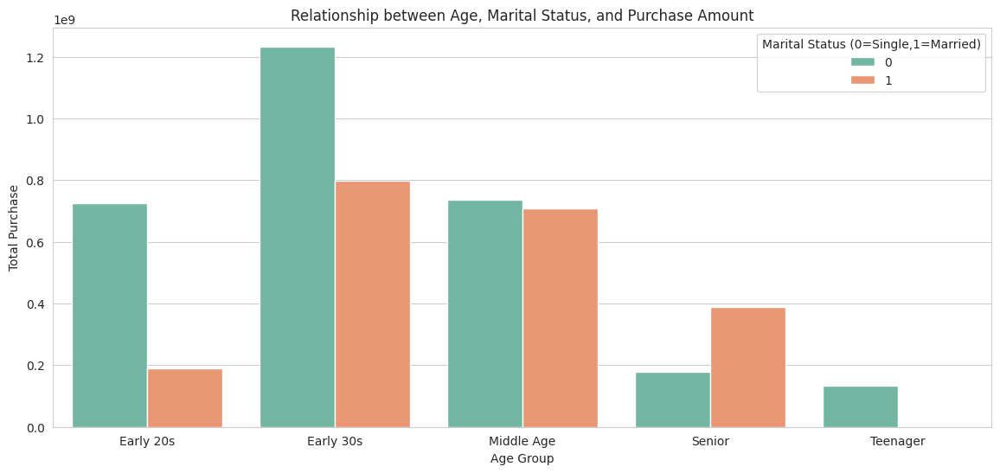

In [216]:
# Aggregate total purchase per Age_Category and Marital_Status
agg_df = df.groupby(['Age_Category', 'Marital_Status'], observed=True)['Purchase'].sum().reset_index()

plt.figure(figsize=(14,6))
sns.barplot(
    data=agg_df,
    x='Age_Category',
    y='Purchase',
    hue='Marital_Status',
    palette='Set2'
)
plt.title("Relationship between Age, Marital Status, and Purchase Amount")
plt.xlabel("Age Group")
plt.ylabel("Total Purchase")
plt.legend(title='Marital Status (0=Single,1=Married)')
plt.show()


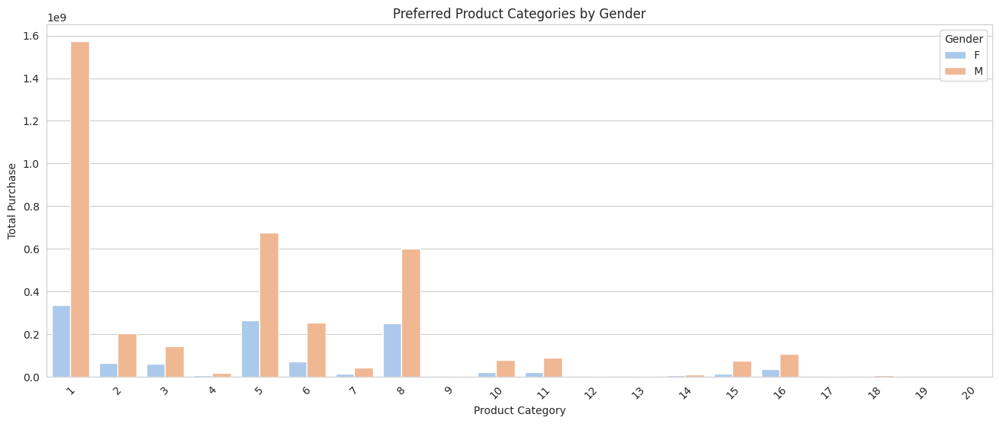

In [217]:
# Aggregate total purchase per Product_Category and Gender
agg_df = df.groupby(['Product_Category', 'Gender'], observed=True)['Purchase'].sum().reset_index()

plt.figure(figsize=(16,6))
sns.barplot(
    data=agg_df,
    x='Product_Category',
    y='Purchase',
    hue='Gender',
    dodge=True,
    palette='pastel'
)
plt.title("Preferred Product Categories by Gender")
plt.xlabel("Product Category")
plt.ylabel("Total Purchase")
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.show()


####For df_user

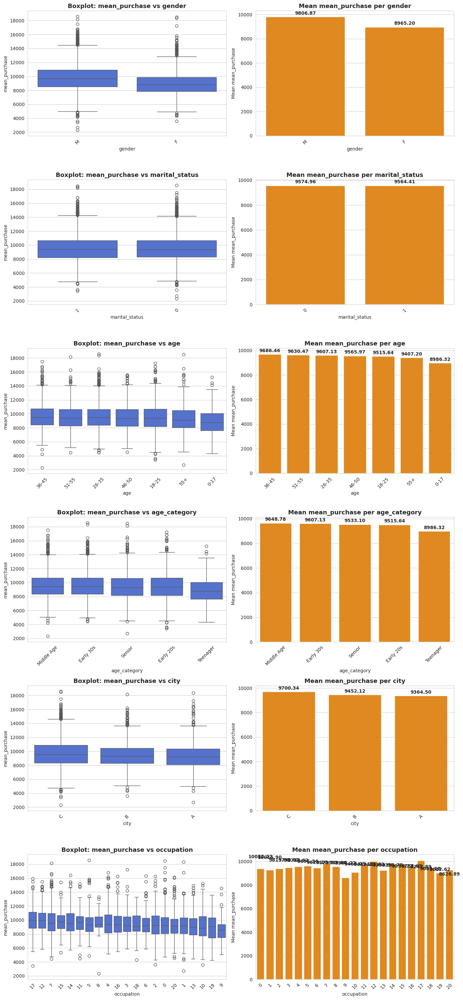

In [177]:
bivariate_box_bar(df_user,user_cat,'mean_purchase')

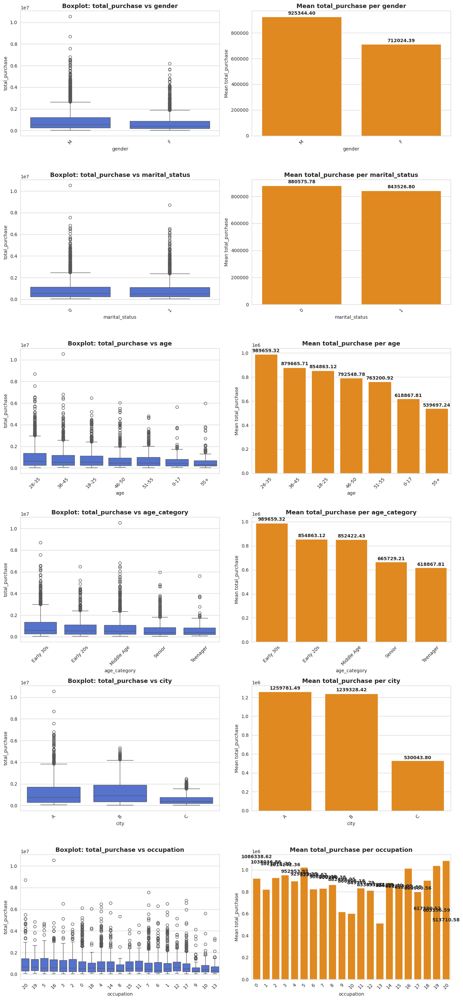

In [178]:
bivariate_box_bar(df_user,user_cat,'total_purchase')

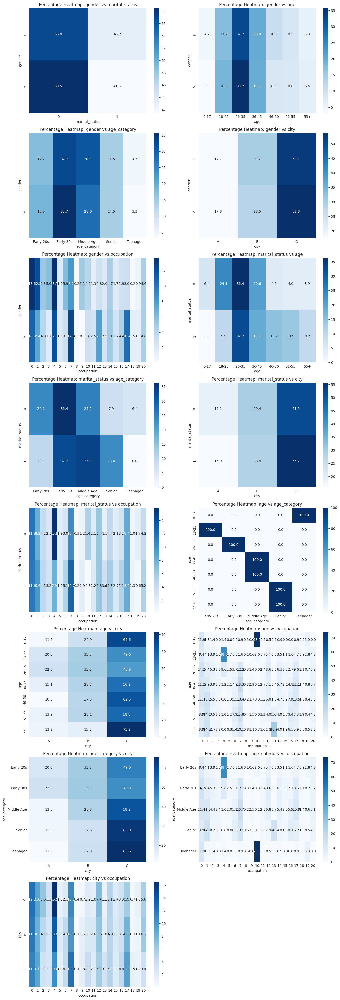

In [191]:
bivariate_cat_plots(df_user, user_cat)

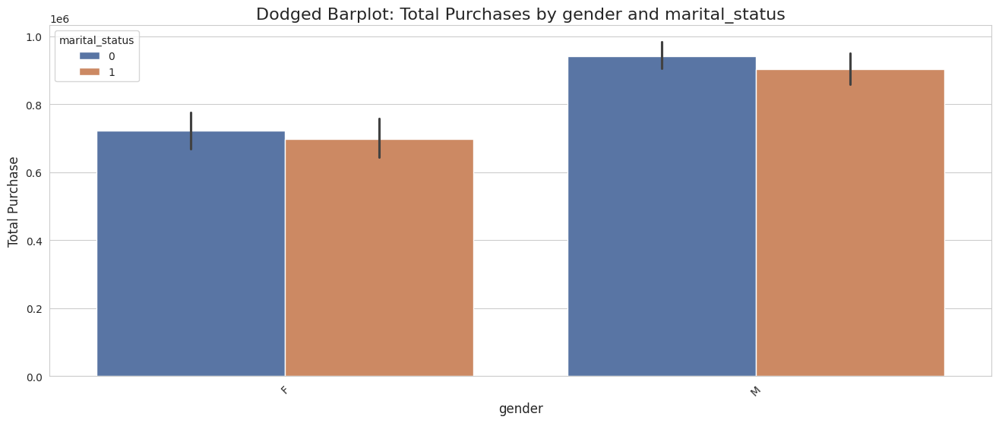

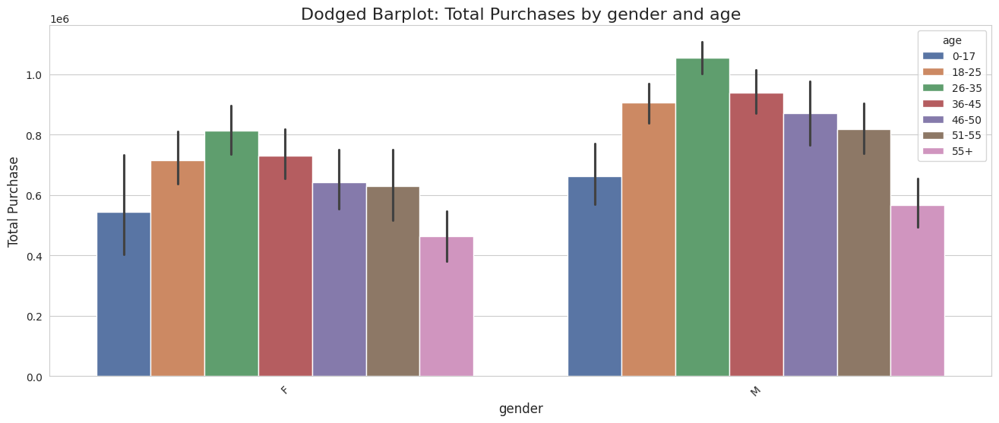

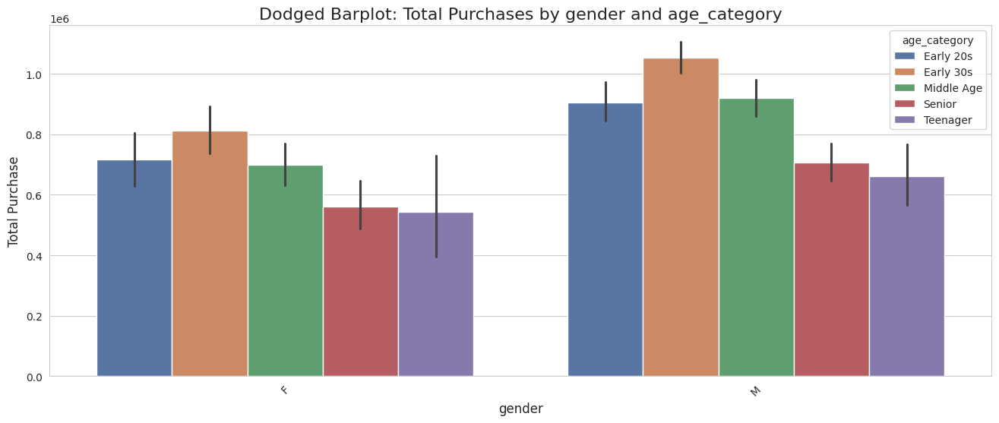

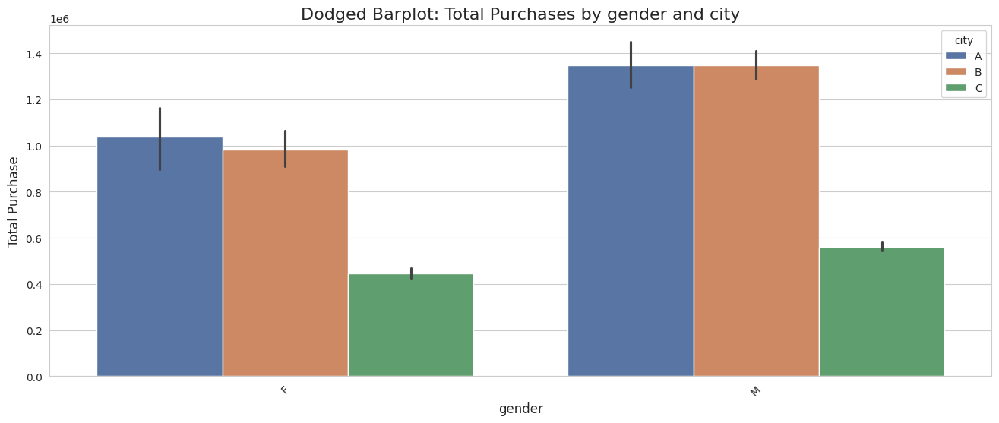

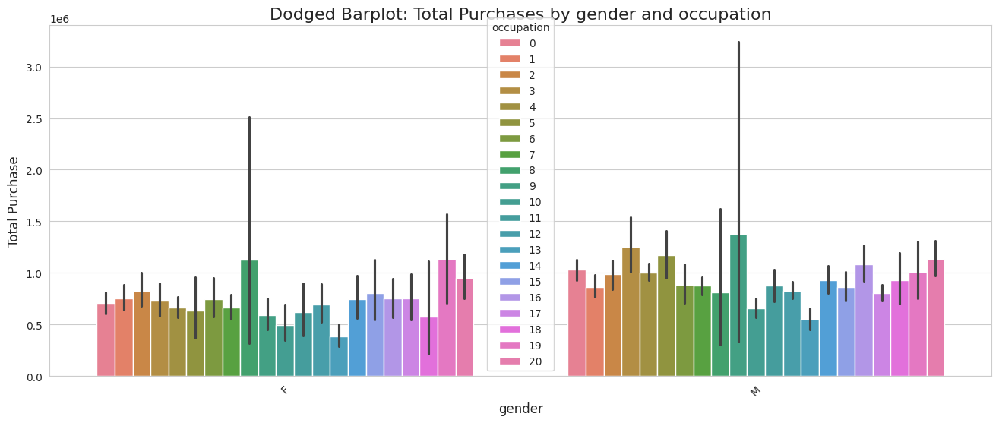

...

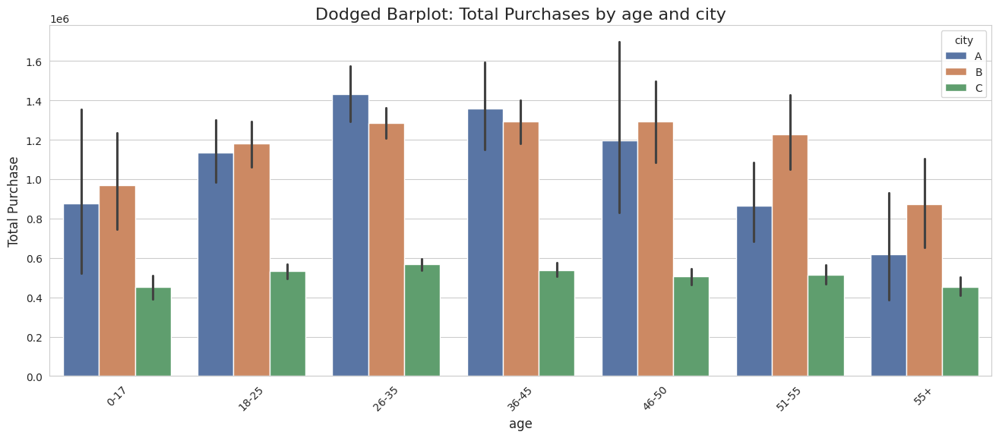

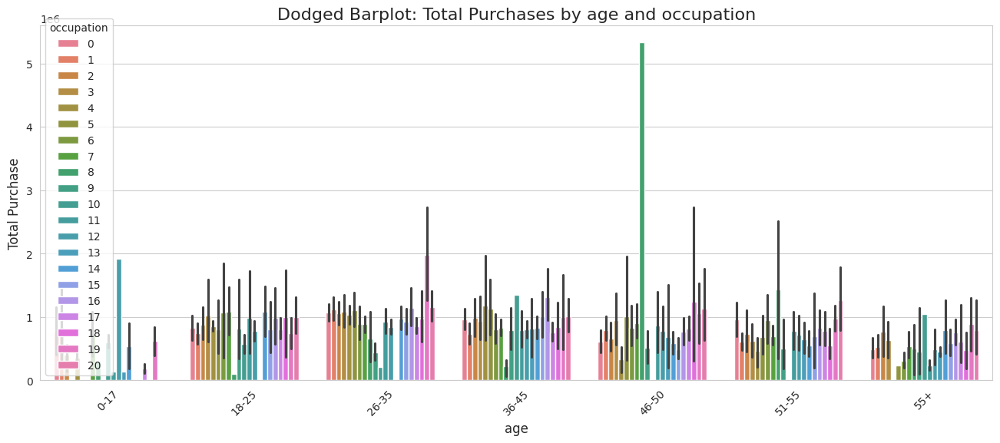

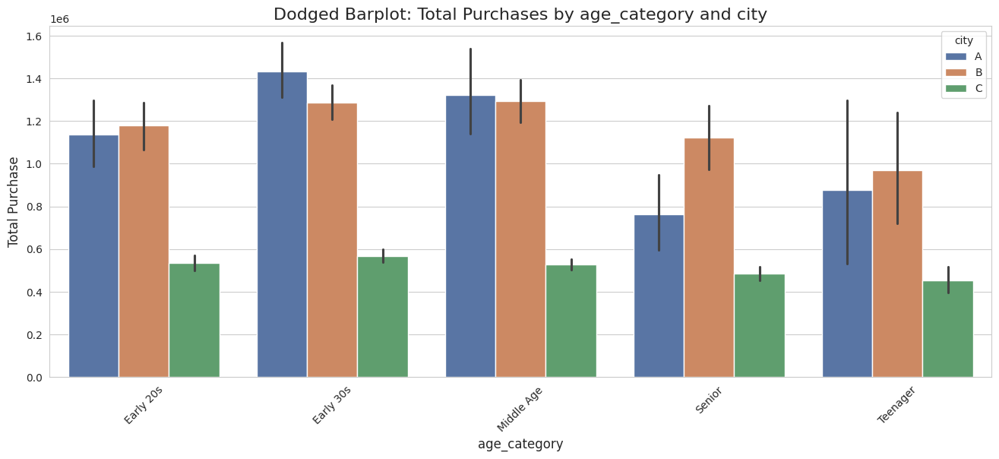

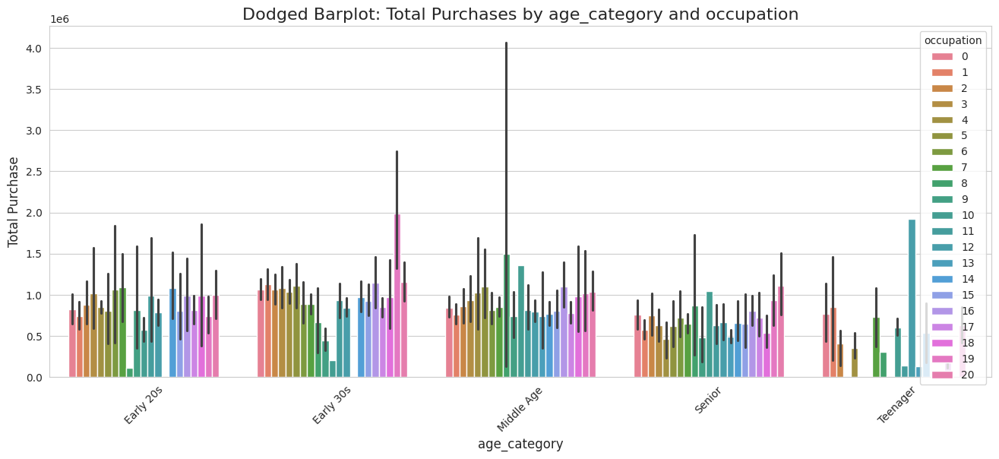

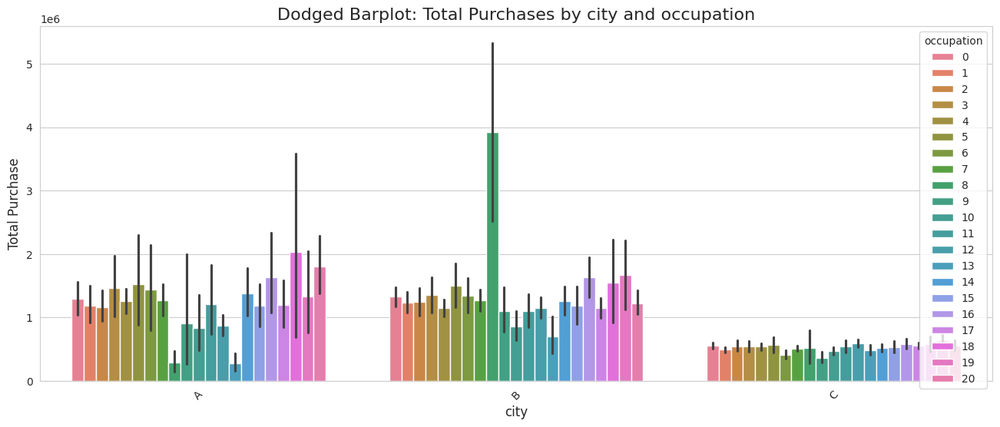

In [210]:
xxx=list(itertools.combinations(user_cat, 2))
for i in xxx:
  plt.figure(figsize=(16,6))
  sns.barplot(
      data=df_user,
      x=i[0],
      y='total_purchase',
      hue=i[1]
  )
  s="Dodged Barplot: Total Purchases by "+str(i[0])+" and "+str(i[1])
  plt.title(s, fontsize=16)
  plt.xlabel(i[0], fontsize=12)
  plt.ylabel("Total Purchase", fontsize=12)
  plt.xticks(rotation=45)
  plt.legend(title=i[1])
  plt.show()

#Missing Value & Outlier Detection

In [180]:
df.isna().sum()

,0
User_ID,0
Product_ID,0
Gender,0
Age,0
Occupation,0
City_Category,0
Stay_In_Current_City_Years,0
Marital_Status,0
Product_Category,0
Purchase,0


In [181]:
df_user.isna().sum()

,0
User_ID,0
mean_purchase,0
total_purchase,0
gender,0
marital_status,0
age,0
age_category,0
city,0
occupation,0



Column: Purchase
Number of outliers (IQR method): 2677


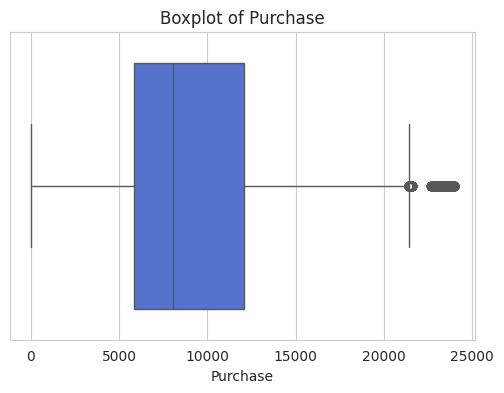

In [182]:
iqr_outliers_boxplot(df)


Column: mean_purchase
Number of outliers (IQR method): 127


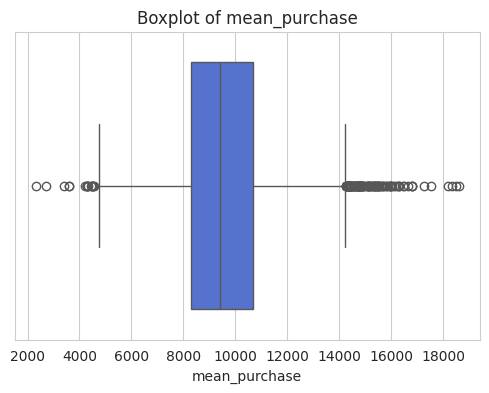


Column: total_purchase
Number of outliers (IQR method): 409


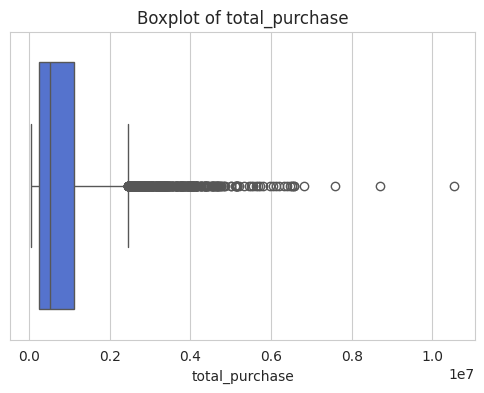

In [183]:
iqr_outliers_boxplot(df_user)

#Confidence Interval & CLT

City_Category=A: n=147720, pop_mean=8911.94, 95% CI=[8886.99, 8936.89], boot_mean=8911.81, boot_CI=[8887.07, 8936.47]
City_Category=B: n=231173, pop_mean=9151.30, 95% CI=[9131.10, 9171.50], boot_mean=9151.25, boot_CI=[9130.93, 9171.47]
City_Category=C: n=171175, pop_mean=9719.92, 95% CI=[9695.34, 9744.50], boot_mean=9719.95, boot_CI=[9695.24, 9744.48]


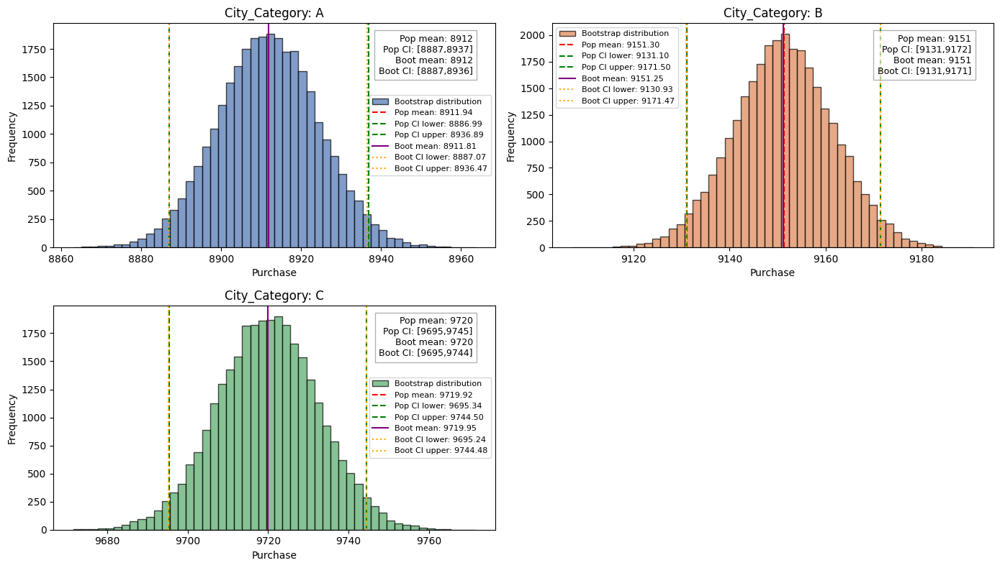

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='City_Category',confidence=0.95,bootstrap_samples=30000)

  - B vs A: 9,151.30 − 8,911.94 ≈ 239.36 (~2.7% higher)

  - C vs B: 9,719.92 − 9,151.30 ≈ 568.62 (~6.2% higher)

  - C vs A: 9,719.92 − 8,911.94 ≈ 807.98 (~9.1% higher)

**City C > B > A in terms of the metric (spending/mean value).**

Insight: City C customers spend noticeably more than A and B, which could influence marketing, targeting, or pricing strategies.

**Actionable Business Takeaways**

  - City C: Focus on premium products, loyalty programs, and personalized offers—highest revenue potential.

  - City B: Consider upselling or cross-selling—moderate spending.

  - City A: Maybe discounts or bundle offers to encourage higher spending.

  - Marketing & Inventory: Prioritize resources and stock based on city spending potential.

Occupation=0: n=69638, pop_mean=9124.43, 95% CI=[9087.50, 9161.35], boot_mean=9124.53, boot_CI=[9088.23, 9161.44]
Occupation=1: n=47426, pop_mean=8953.19, 95% CI=[8909.65, 8996.74], boot_mean=8953.28, boot_CI=[8910.33, 8996.43]
Occupation=2: n=26588, pop_mean=8952.48, 95% CI=[8893.11, 9011.85], boot_mean=8952.39, boot_CI=[8893.16, 9011.18]
Occupation=3: n=17650, pop_mean=9178.59, 95% CI=[9104.81, 9252.37], boot_mean=9178.78, boot_CI=[9104.81, 9253.15]
Occupation=4: n=72308, pop_mean=9213.98, 95% CI=[9177.22, 9250.74], boot_mean=9214.08, boot_CI=[9177.10, 9251.03]
Occupation=5: n=12177, pop_mean=9333.15, 95% CI=[9243.89, 9422.41], boot_mean=9332.96, boot_CI=[9244.10, 9423.00]
Occupation=6: n=20355, pop_mean=9256.54, 95% CI=[9188.00, 9325.08], boot_mean=9256.43, boot_CI=[9187.93, 9324.87]
Occupation=7: n=59133, pop_mean=9425.73, 95% CI=[9384.73, 9466.72], boot_mean=9425.80, boot_CI=[9384.97, 9466.94]
Occupation=8: n=1546, pop_mean=9532.59, 95% CI=[9287.51, 9777.67], boot_mean=9533.08, bo

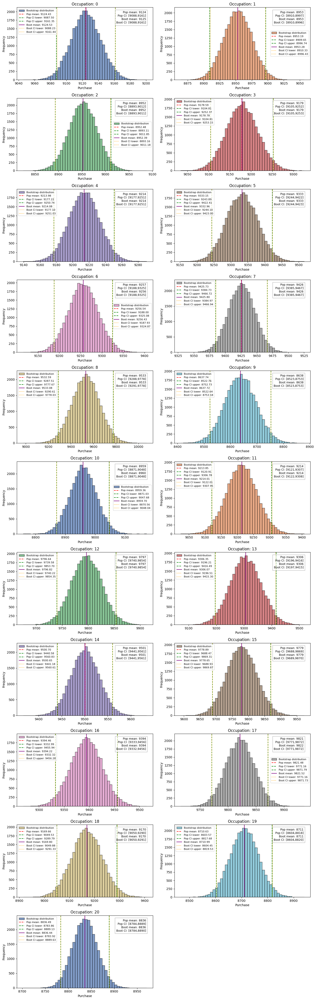

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Occupation',confidence=0.95,bootstrap_samples=30000)

- Spending Trends by Occupation

    - Lowest average spending:

        - Occupation 9 → 8,637.74

        - Occupation 19 → 8,710.63

        - Occupation 20 → 8,836.49

    - Highest average spending:

        - Occupation 17 → 9,821.48

        - Occupation 12 → 9,796.64

        - Occupation 15 → 9,778.89

>Insight: There’s a clear range of spending across occupations—almost 1,200 difference between the lowest and highest. Occupations 12, 15, and 17 are high-value segments.

>Premium targeting: Focus on Occupations 12, 15, 17, 14, 8 for high-value products, upsells, or exclusive offers.

>Encourage spending: Occupations 9, 19, 20 could be targeted with promotions or loyalty rewards.

| Segment         | Mean Purchase | Notes                                             |
| --------------- | ------------- | ------------------------------------------------- |
| Low spending    | 8,638–8,836   | Occupations 9, 19, 20 → need incentives           |
| Medium spending | 8,950–9,400   | Most occupations → regular engagement             |
| High spending   | 9,500–9,820   | Occupations 8, 12, 14, 15, 17 → premium targeting |


Stay_In_Current_City_Years=0: n=74398, pop_mean=9180.08, 95% CI=[9144.22, 9215.94], boot_mean=9180.09, boot_CI=[9144.19, 9216.08]
Stay_In_Current_City_Years=1: n=193821, pop_mean=9250.15, 95% CI=[9227.76, 9272.53], boot_mean=9250.20, boot_CI=[9227.90, 9272.61]
Stay_In_Current_City_Years=2: n=101838, pop_mean=9320.43, 95% CI=[9289.45, 9351.41], boot_mean=9320.47, boot_CI=[9289.72, 9351.54]
Stay_In_Current_City_Years=3: n=95285, pop_mean=9286.90, 95% CI=[9255.03, 9318.78], boot_mean=9287.03, boot_CI=[9255.04, 9318.83]
Stay_In_Current_City_Years=4+: n=84726, pop_mean=9275.60, 95% CI=[9241.81, 9309.38], boot_mean=9275.68, boot_CI=[9241.87, 9309.65]


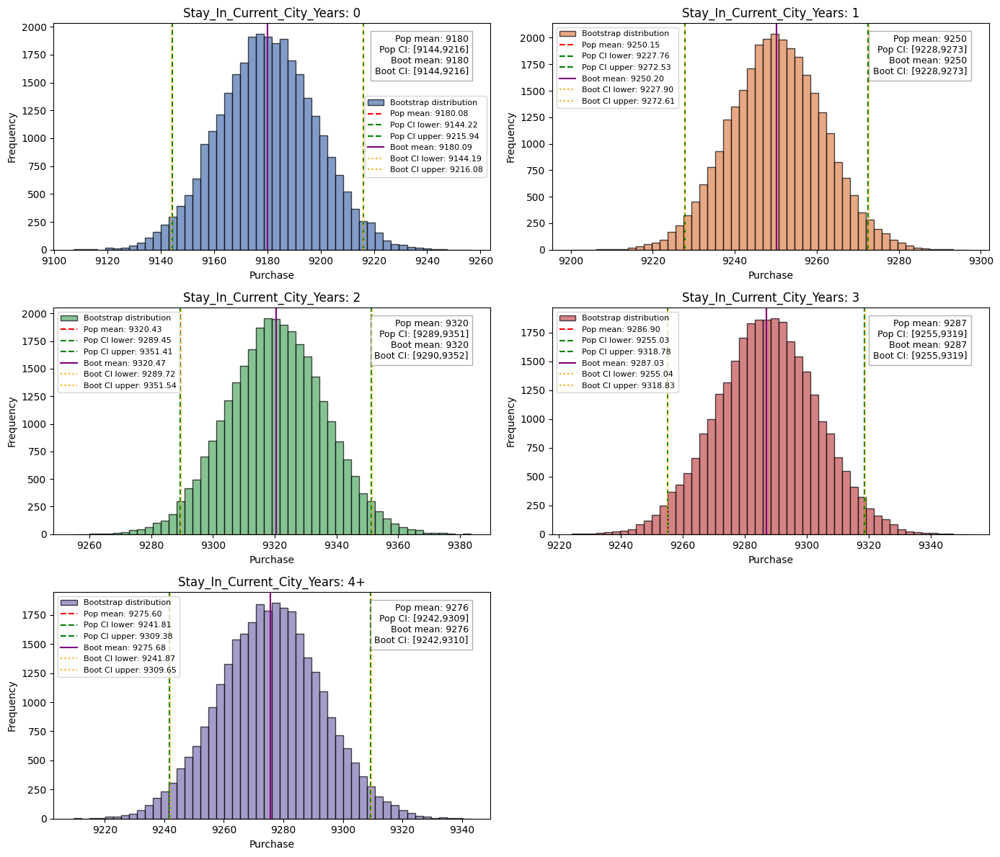

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Stay_In_Current_City_Years',confidence=0.95,bootstrap_samples=30000)

Product_Category=1: n=140378, pop_mean=13606.22, 95% CI=[13583.73, 13628.71], boot_mean=13606.33, boot_CI=[13583.84, 13628.48]
Product_Category=2: n=23864, pop_mean=11251.94, 95% CI=[11206.63, 11297.24], boot_mean=11252.17, boot_CI=[11206.72, 11297.14]
Product_Category=3: n=20213, pop_mean=10096.71, 95% CI=[10057.77, 10135.65], boot_mean=10096.65, boot_CI=[10057.60, 10135.58]
Product_Category=4: n=11753, pop_mean=2329.66, 95% CI=[2314.97, 2344.35], boot_mean=2329.74, boot_CI=[2315.10, 2344.29]
Product_Category=5: n=150933, pop_mean=6240.09, 95% CI=[6230.46, 6249.72], boot_mean=6240.10, boot_CI=[6230.55, 6249.77]
Product_Category=6: n=20466, pop_mean=15838.48, 95% CI=[15783.52, 15893.43], boot_mean=15838.28, boot_CI=[15783.35, 15893.24]
Product_Category=7: n=3721, pop_mean=16365.69, 95% CI=[16231.56, 16499.82], boot_mean=16365.61, boot_CI=[16232.50, 16499.45]
Product_Category=8: n=113925, pop_mean=7498.96, 95% CI=[7487.27, 7510.65], boot_mean=7499.01, boot_CI=[7487.45, 7510.64]
Product_

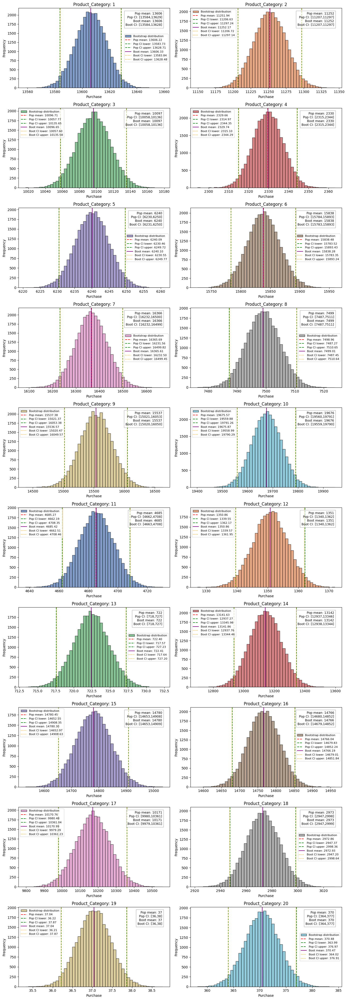

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Product_Category',confidence=0.95,bootstrap_samples=30000)

# Questions

##Q-1

1. Are women spending more money per transaction than men? Why or Why not?

In [ ]:
male=df['Gender']=='M'
female=df['Gender']=='F'

m_tran_no=sum(male)
f_tran_no=sum(female)

m_pur_amt=np.sum(df[male]['Purchase'])
f_pur_amt=np.sum(df[female]['Purchase'])

print("Total Payment Amount by Males : ",m_pur_amt)
print("Total Payment Amount by Females : ",f_pur_amt)
print()
print("Total No. of Transactions By Male : ",m_tran_no)
print("Total No. of Transactions By Female : ",f_tran_no)
print()
print("Avg. spending per transactions :")
print("By Male : ",m_pur_amt/m_tran_no)
print("By Female : ",f_pur_amt/f_tran_no)

Total Payment Amount by Males :  3909580100
Total Payment Amount by Females :  1186232642

Total No. of Transactions By Male :  414259
Total No. of Transactions By Female :  135809

Avg. spending per transactions :
By Male :  9437.526040472265
By Female :  8734.565765155476


 - Higher total spending by males

>Males contributed ~76% of total payment.

>This is mainly because they made ~3x more transactions than females.

>So the high total spending is driven by transaction frequency, not just the amount per purchase.

>Why it happens:

>Could be demographic skew in the dataset (more male shoppers).

>Product categories might be more appealing to males.

>Black Friday might attract male shoppers for electronics or high-value items.

<br>


 - Average spending per transaction slightly higher for males

>Males spend ~9,437 vs females 8,735 per transaction → ~8% more.

>Why it happens:

>Males may buy higher-priced items or more quantity per transaction.

>Females may prefer smaller-ticket purchases or shop more selectively.

<br>


 - Implications of transaction vs amount

>Total spending = No. of transactions × Average spending.

>Here, the main driver is transaction count, not just average spending.

>Even though average spending difference is small, the volume difference amplifies the total revenue from males.

<br>

- Other possible factors

>Age distribution: If more males are in high-spending age groups, that can explain higher totals.

>Product preference: Electronics, gadgets, and accessories could be skewed male.

>Promotional behavior: Males might be more responsive to bulk deals or high-value discounts.

##Q-2 & Q-3
2. Confidence intervals and distribution of the mean of the expenses by female and male customers?

3. Are confidence intervals of average male and female spending overlapping? How can Walmart leverage this conclusion to make changes or improvements?

Gender=F: n=135809, pop_mean=8734.57, 95% CI=[8709.21, 8759.92], boot_mean=8735.11, boot_CI=[8710.10, 8761.09]
Gender=M: n=414259, pop_mean=9437.53, 95% CI=[9422.02, 9453.03], boot_mean=9437.87, boot_CI=[9419.79, 9453.56]


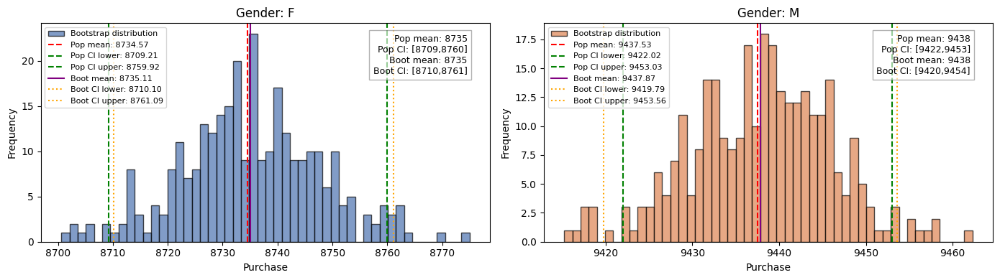

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Gender',confidence=0.95,bootstrap_samples=300)

Gender=F: n=135809, pop_mean=8734.57, 95% CI=[8709.21, 8759.92], boot_mean=8734.69, boot_CI=[8709.37, 8760.01]
Gender=M: n=414259, pop_mean=9437.53, 95% CI=[9422.02, 9453.03], boot_mean=9437.50, boot_CI=[9421.81, 9452.90]


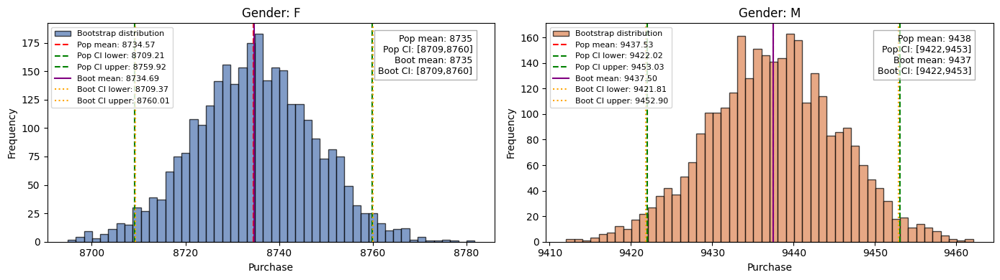

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Gender',confidence=0.95,bootstrap_samples=3000)

Gender=F: n=135809, pop_mean=8734.57, 95% CI=[8709.21, 8759.92], boot_mean=8734.54, boot_CI=[8709.20, 8759.81]
Gender=M: n=414259, pop_mean=9437.53, 95% CI=[9422.02, 9453.03], boot_mean=9437.52, boot_CI=[9422.09, 9453.06]


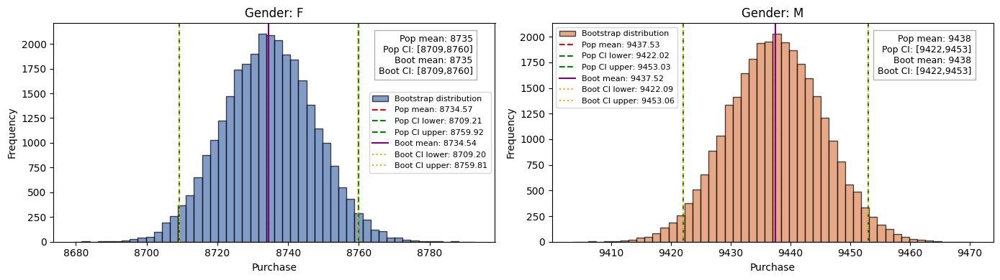

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Gender',confidence=0.95,bootstrap_samples=30000)

>Observation: There is no overlap between male and female CIs.

>We can say with 95% confidence that the average spending of males is higher than that of females.


      The non-overlapping confidence intervals show a clear difference in spending behavior.
      Walmart can leverage this insight to:

      - Optimize marketing campaigns/promotions
      - Adjust inventory and promotions per gender
      - Introduce tailored pricing and product bundles

##Q-4

4. Results when the same activity is performed for Married vs Unmarried

Marital_Status=0: n=324731, pop_mean=9265.91, 95% CI=[9248.62, 9283.20], boot_mean=9266.56, boot_CI=[9248.36, 9284.29]
Marital_Status=1: n=225337, pop_mean=9261.17, 95% CI=[9240.46, 9281.89], boot_mean=9260.40, boot_CI=[9240.67, 9280.26]


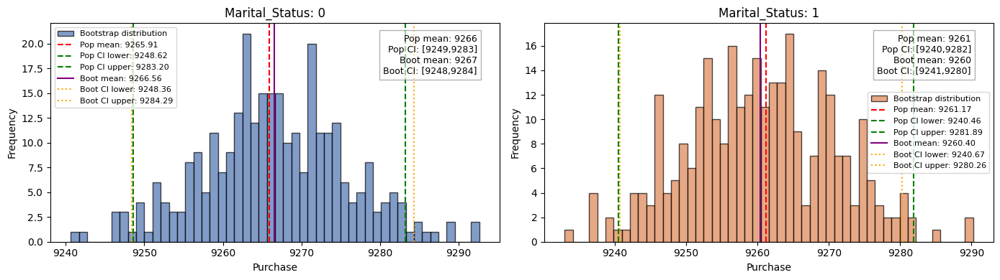

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Marital_Status',confidence=0.95,bootstrap_samples=300)

Marital_Status=0: n=324731, pop_mean=9265.91, 95% CI=[9248.62, 9283.20], boot_mean=9265.91, boot_CI=[9248.64, 9282.73]
Marital_Status=1: n=225337, pop_mean=9261.17, 95% CI=[9240.46, 9281.89], boot_mean=9260.97, boot_CI=[9240.32, 9282.71]


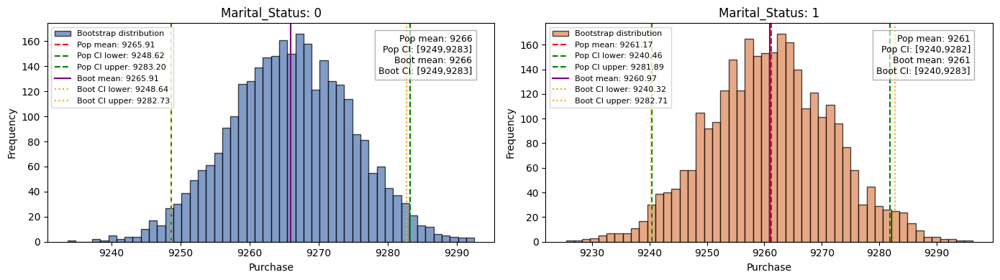

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Marital_Status',confidence=0.95,bootstrap_samples=3000)

Marital_Status=0: n=324731, pop_mean=9265.91, 95% CI=[9248.62, 9283.20], boot_mean=9265.92, boot_CI=[9248.52, 9283.00]
Marital_Status=1: n=225337, pop_mean=9261.17, 95% CI=[9240.46, 9281.89], boot_mean=9261.17, boot_CI=[9240.81, 9282.03]


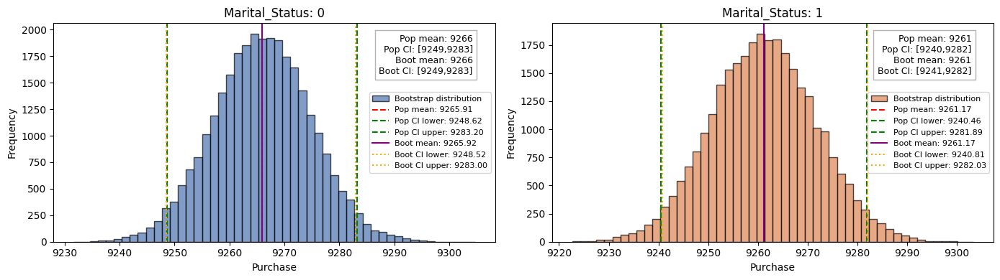

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Marital_Status',confidence=0.95,bootstrap_samples=30000)

>Insight: The CIs almost completely overlap, confirming no meaningful difference in spending between married and unmarried customers.

##Q-5

5. Results when the same activity is performed for Age & Age_Category

###Age

Age=0-17: n=15102, pop_mean=8933.46, 95% CI=[8851.95, 9014.98], boot_mean=8927.18, boot_CI=[8845.84, 9006.67]
Age=18-25: n=99660, pop_mean=9169.66, 95% CI=[9138.41, 9200.92], boot_mean=9169.31, boot_CI=[9133.45, 9204.72]
Age=26-35: n=219587, pop_mean=9252.69, 95% CI=[9231.73, 9273.65], boot_mean=9252.01, boot_CI=[9227.94, 9273.30]
Age=36-45: n=110013, pop_mean=9331.35, 95% CI=[9301.67, 9361.03], boot_mean=9331.02, boot_CI=[9302.09, 9358.05]
Age=46-50: n=45701, pop_mean=9208.63, 95% CI=[9163.09, 9254.17], boot_mean=9209.14, boot_CI=[9163.03, 9253.33]
Age=51-55: n=38501, pop_mean=9534.81, 95% CI=[9483.99, 9585.62], boot_mean=9531.59, boot_CI=[9487.83, 9586.47]
Age=55+: n=21504, pop_mean=9336.28, 95% CI=[9269.30, 9403.26], boot_mean=9338.64, boot_CI=[9274.98, 9410.86]


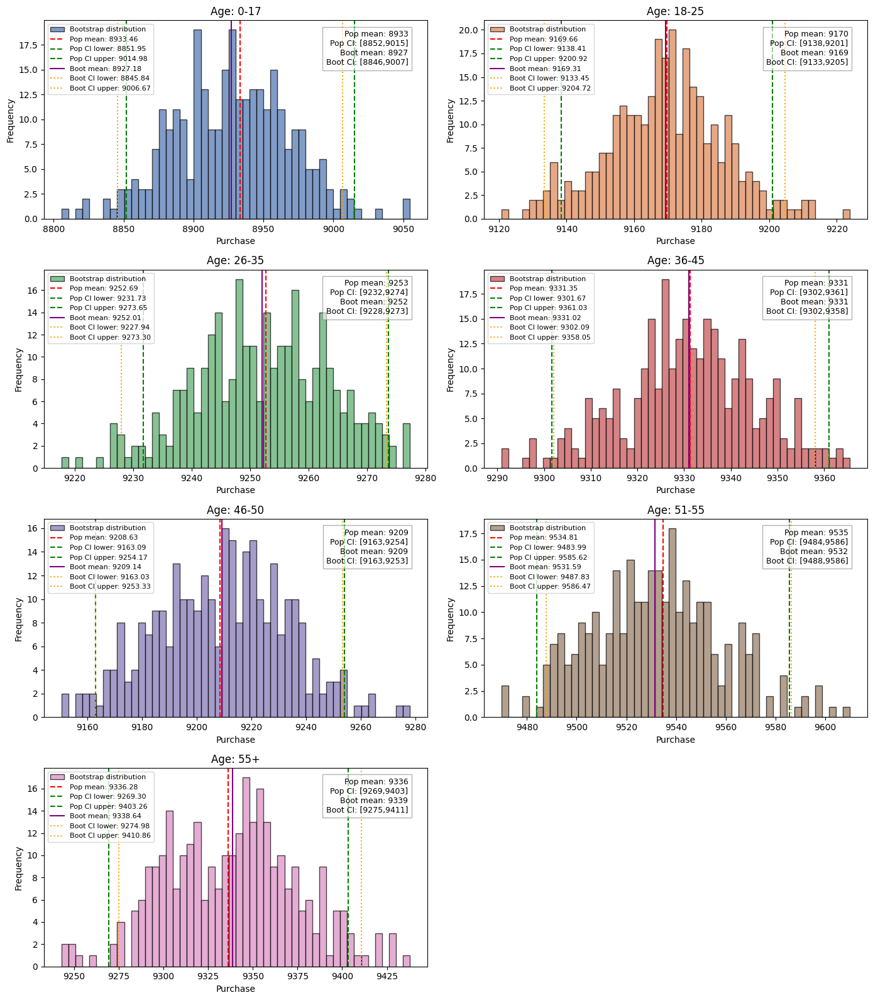

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Age',confidence=0.95,bootstrap_samples=300)

Age=0-17: n=15102, pop_mean=8933.46, 95% CI=[8851.95, 9014.98], boot_mean=8933.22, boot_CI=[8851.67, 9015.89]
Age=18-25: n=99660, pop_mean=9169.66, 95% CI=[9138.41, 9200.92], boot_mean=9169.59, boot_CI=[9138.45, 9201.40]
Age=26-35: n=219587, pop_mean=9252.69, 95% CI=[9231.73, 9273.65], boot_mean=9252.60, boot_CI=[9231.88, 9273.85]
Age=36-45: n=110013, pop_mean=9331.35, 95% CI=[9301.67, 9361.03], boot_mean=9331.46, boot_CI=[9301.14, 9361.56]
Age=46-50: n=45701, pop_mean=9208.63, 95% CI=[9163.09, 9254.17], boot_mean=9208.78, boot_CI=[9163.85, 9254.11]
Age=51-55: n=38501, pop_mean=9534.81, 95% CI=[9483.99, 9585.62], boot_mean=9534.89, boot_CI=[9483.04, 9586.13]
Age=55+: n=21504, pop_mean=9336.28, 95% CI=[9269.30, 9403.26], boot_mean=9336.22, boot_CI=[9271.19, 9401.80]


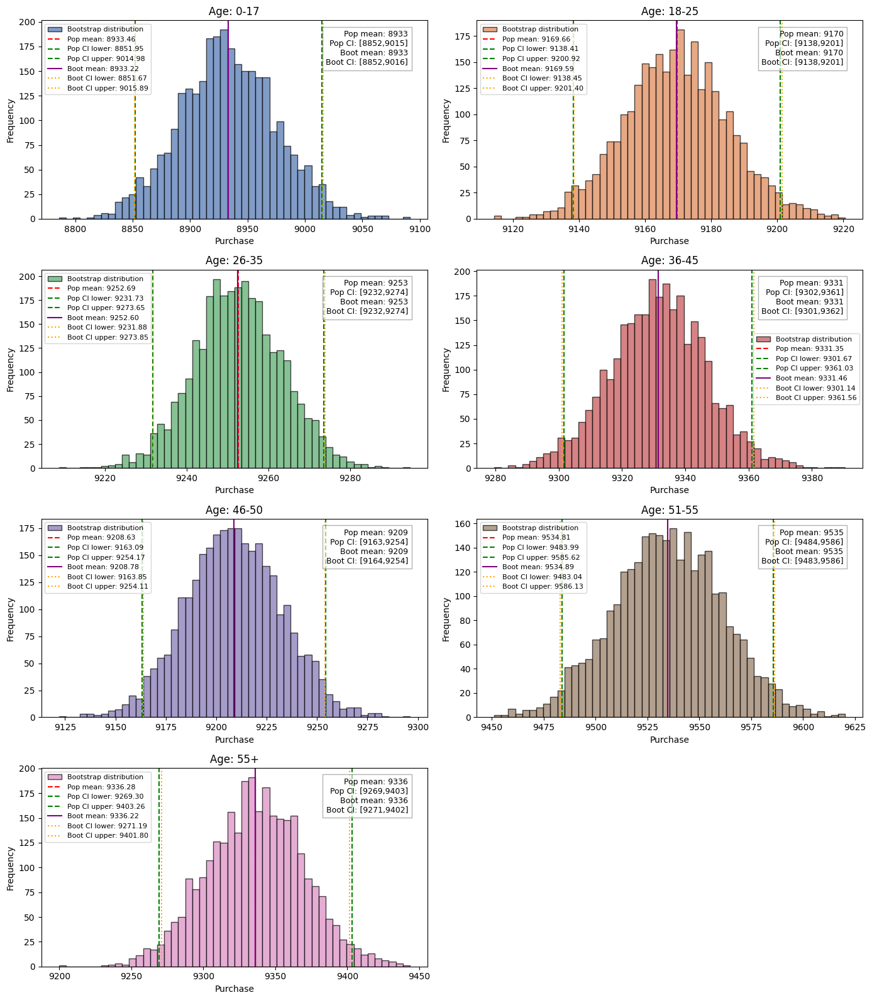

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Age',confidence=0.95,bootstrap_samples=3000)

Age=0-17: n=15102, pop_mean=8933.46, 95% CI=[8851.95, 9014.98], boot_mean=8933.54, boot_CI=[8851.38, 9015.11]
Age=18-25: n=99660, pop_mean=9169.66, 95% CI=[9138.41, 9200.92], boot_mean=9169.57, boot_CI=[9137.99, 9200.64]
Age=26-35: n=219587, pop_mean=9252.69, 95% CI=[9231.73, 9273.65], boot_mean=9252.67, boot_CI=[9231.86, 9273.64]
Age=36-45: n=110013, pop_mean=9331.35, 95% CI=[9301.67, 9361.03], boot_mean=9331.33, boot_CI=[9301.43, 9361.29]
Age=46-50: n=45701, pop_mean=9208.63, 95% CI=[9163.09, 9254.17], boot_mean=9208.60, boot_CI=[9162.70, 9254.05]
Age=51-55: n=38501, pop_mean=9534.81, 95% CI=[9483.99, 9585.62], boot_mean=9534.68, boot_CI=[9483.78, 9585.52]
Age=55+: n=21504, pop_mean=9336.28, 95% CI=[9269.30, 9403.26], boot_mean=9336.20, boot_CI=[9269.73, 9401.83]


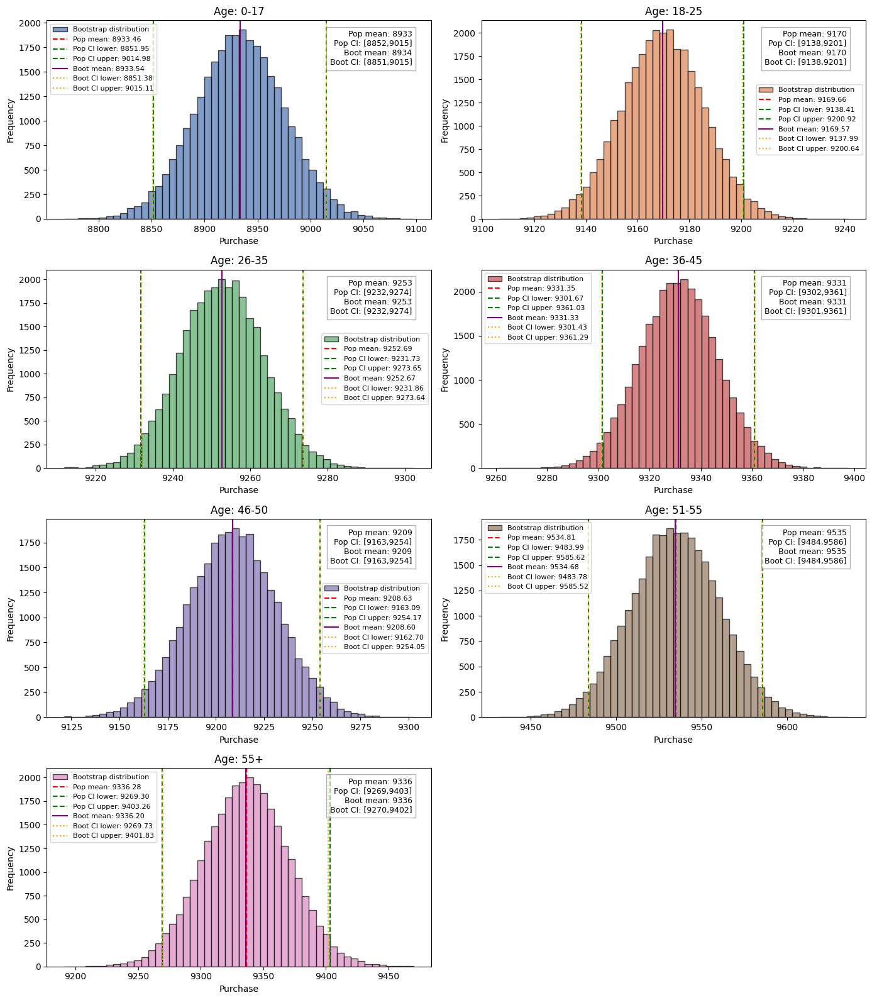

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Age',confidence=0.95,bootstrap_samples=30000)

>Insight: The 26–35 and 36–45 age groups have the largest representation. Young (0–17) and older (55+) segments are smaller but still significant.

- Highest average purchase: 51–55 (9,535) → potential high-value buyers.

- Lowest average purchase: 0–17 (8,933) → as expected, mostly dependents or smaller transactions.

- Overall, purchase increases with age until mid-50s, then slightly drops or stabilizes.

**Actionable Insights**

1. High-value targeting: Age 51–55, 55+, 36–45 → premium campaigns, upsells.

2. Regular engagement: 26–35 → largest segment, steady spending → focus on loyalty, repeat purchases.

3. Low-ticket segment: 0–17 → could be targeted indirectly through parents (married customers) or bundled offers.

4. Marketing strategy: Age is a good predictor of spending, unlike marital status.

| Age Group | Avg Purchase | Notes                             |
| --------- | ------------ | --------------------------------- |
| 0–17      | 8,933        | Small spenders, minor segment     |
| 18–25     | 9,170        | Growing segment, moderate spend   |
| 26–35     | 9,253        | Largest segment, consistent spend |
| 36–45     | 9,331        | Increasing spend, target upsells  |
| 46–50     | 9,209        | Slight dip, moderate spend        |
| 51–55     | 9,535        | Highest spenders, premium focus   |
| 55+       | 9,336        | High spenders, smaller segment    |


###Age-Category

Age_Category=Early 20s: n=99660, pop_mean=9169.66, 95% CI=[9138.41, 9200.92], boot_mean=9168.58, boot_CI=[9139.56, 9200.87]
Age_Category=Early 30s: n=219587, pop_mean=9252.69, 95% CI=[9231.73, 9273.65], boot_mean=9252.77, boot_CI=[9233.22, 9273.72]
Age_Category=Middle Age: n=155714, pop_mean=9295.33, 95% CI=[9270.46, 9320.20], boot_mean=9295.59, boot_CI=[9271.25, 9320.38]
Age_Category=Senior: n=60005, pop_mean=9463.66, 95% CI=[9423.17, 9504.16], boot_mean=9463.65, boot_CI=[9422.07, 9501.06]
Age_Category=Teenager: n=15102, pop_mean=8933.46, 95% CI=[8851.95, 9014.98], boot_mean=8934.62, boot_CI=[8857.08, 9022.55]


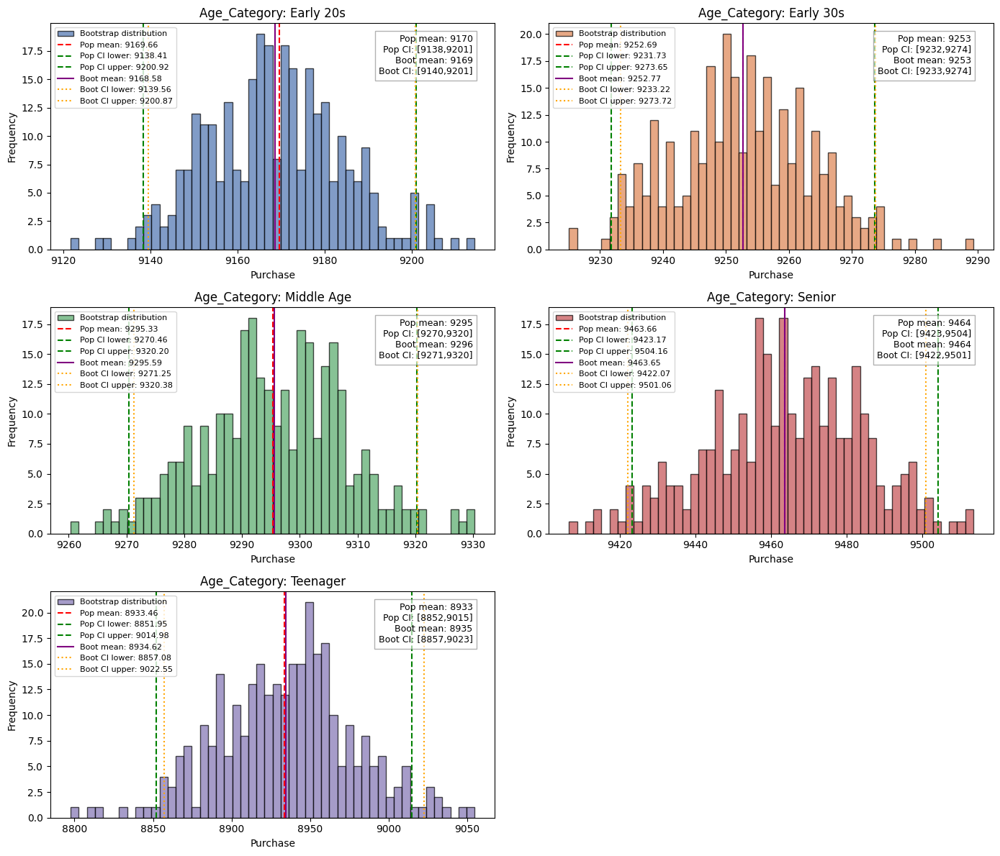

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Age_Category',confidence=0.95,bootstrap_samples=300)

Age_Category=Early 20s: n=99660, pop_mean=9169.66, 95% CI=[9138.41, 9200.92], boot_mean=9169.53, boot_CI=[9139.00, 9201.04]
Age_Category=Early 30s: n=219587, pop_mean=9252.69, 95% CI=[9231.73, 9273.65], boot_mean=9252.81, boot_CI=[9231.81, 9273.71]
Age_Category=Middle Age: n=155714, pop_mean=9295.33, 95% CI=[9270.46, 9320.20], boot_mean=9295.52, boot_CI=[9270.28, 9320.91]
Age_Category=Senior: n=60005, pop_mean=9463.66, 95% CI=[9423.17, 9504.16], boot_mean=9464.04, boot_CI=[9425.88, 9502.07]
Age_Category=Teenager: n=15102, pop_mean=8933.46, 95% CI=[8851.95, 9014.98], boot_mean=8934.39, boot_CI=[8853.31, 9015.60]


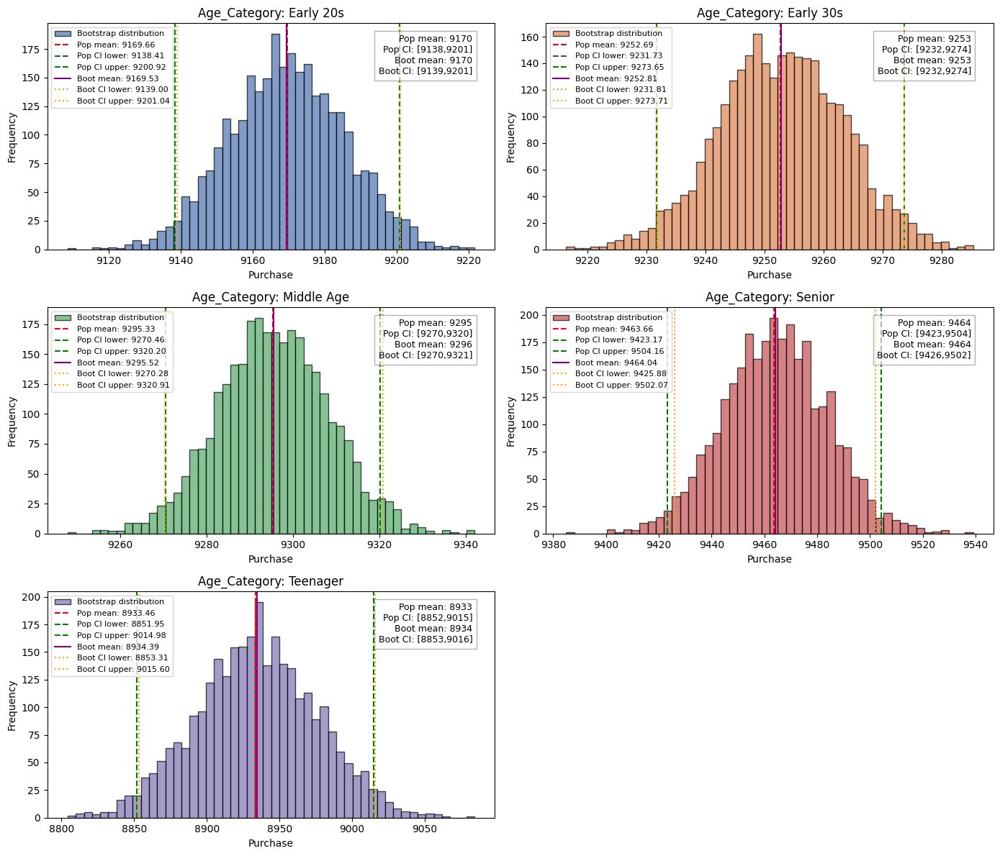

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Age_Category',confidence=0.95,bootstrap_samples=3000)

Age_Category=Early 20s: n=99660, pop_mean=9169.66, 95% CI=[9138.41, 9200.92], boot_mean=9169.70, boot_CI=[9138.60, 9200.94]
Age_Category=Early 30s: n=219587, pop_mean=9252.69, 95% CI=[9231.73, 9273.65], boot_mean=9252.61, boot_CI=[9231.65, 9273.52]
Age_Category=Middle Age: n=155714, pop_mean=9295.33, 95% CI=[9270.46, 9320.20], boot_mean=9295.28, boot_CI=[9270.68, 9319.97]
Age_Category=Senior: n=60005, pop_mean=9463.66, 95% CI=[9423.17, 9504.16], boot_mean=9463.71, boot_CI=[9423.42, 9504.71]
Age_Category=Teenager: n=15102, pop_mean=8933.46, 95% CI=[8851.95, 9014.98], boot_mean=8933.61, boot_CI=[8852.19, 9015.19]


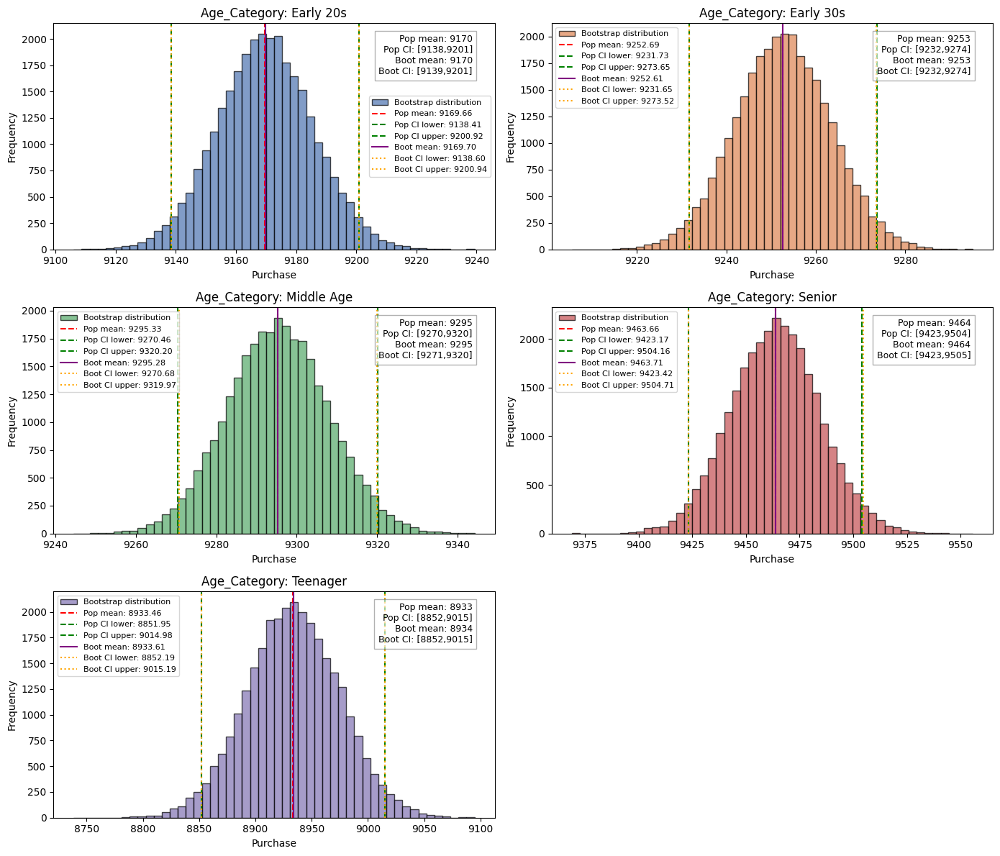

In [ ]:
plot_purchase_distribution_by_category(df,target_col='Purchase',cat_col='Age_Category',confidence=0.95,bootstrap_samples=30000)

>Insight: Largest segments are Early 30s and Middle Age, while Teenagers are the smallest.

- Spending increases with age, peaking at Seniors.

- Teenagers spend the least, consistent with dependency or smaller transaction amounts.

- Seniors (60+) are the highest spenders per purchase, despite smaller sample size.

Actionable Insights

High-value targeting: Seniors and Middle Age → premium campaigns, upselling, loyalty programs.

Large engagement: Early 30s → largest segment, focus on repeat purchase and loyalty.

Growth potential: Early 20s → invest in brand engagement to convert to long-term buyers.

Teenagers: small spenders → can be targeted indirectly via parents or bundle offers.

| Age Category | Avg Purchase | Notes                                   |
| ------------ | ------------ | --------------------------------------- |
| Teenager     | 8,933        | Low spending                            |
| Early 20s    | 9,170        | Moderate, potential long-term customers |
| Early 30s    | 9,253        | Largest segment, consistent spend       |
| Middle Age   | 9,295        | High-value, upsell opportunities        |
| Senior       | 9,464        | Highest spenders, premium targeting     |
